# 2<sup>η</sup> ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ
## Ανάλυση Κοινωνικής Δομής σε Τεχνητές και Πραγματικές Σύνθετες Τοπολογίες Δικτύων
### Ονοματεπώνυμο: Καμπουγέρης Χαράλαμπος
### ΑΜ: 03120098

<p style=text-align:justify>Στην παρούσα άσκηση θα αναλυθούν τεχνητές και πραγματικές τοπολογίες σύνθετων δικτύων με βάση τις μετρικές που χρησιμοποιήθηκαν στην προηγούμενη άσκηση και κάποιες τεχνικές που έχουν ως στόχο την εύρεση κοινωνικής δομής. Συγκεκριμένα, θα χρησιμοποιηθούν και θα συγκριθούν διάφοροι αλγόριθμοι εντοπισμού κοινοτήτων σε γράφους δικτύων που προκύπτουν από πραγματικά δεδομένα καθώς και στους συνθετικούς γράφους της πρώτης εργαστηριακής άσκησης.</p>

In [1]:
%matplotlib inline

import matplotlib
import networkx as nx
import random
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
from sklearn.cluster import SpectralClustering

<h3>Α. Μελέτη πραγματικών τοπολογιών</h3>
<p style=text-align:justify>Στο παρόν ερώτημα θα μελετήσετε και θα αποκτήσετε αίσθηση της τοπολογικής δομής πραγματικών δικτύων. Πιο συγκεκριμένα, για τις τοπολογίες που φαίνονται στον <b>πίνακα 1</b>, να βρεθούν και να δειχθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός κάθε τοπολογίας.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης κόμβου και ο μέσος συντελεστής ομαδοποίησης κάθε τοπολογίας.</li>
    <li>Η κατανομή της κεντρικότητας εγγύτητας και η μέση κεντρικότητα εγγύτητας κάθε τοπολογίας.</li>
</ol>
<p style=text-align:justify>Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο κάθε μίας από τις πραγματικές τοπολογίες με βάση τους τύπους δικτύων που εξετάστηκαν στην πρώτη εργαστηριακή άσκηση.</p>

<table style=width:100%>
    <caption>Πίνακας <b>1</b>: Πραγματικές τοπολογίες</a></caption>
<tr>
    <th style=text-align:left>Τοπολογία</th>
    <th style=text-align:left>Αρχείο</th>
    <th style=text-align:left>Περιγραφή</th>
</tr>
<tr>
    <td style=text-align:left>American College Football</td>
    <td style=text-align:left><a style=text-decoration:none href='https://helios.ntua.gr/pluginfile.php/43944/mod_assign/intro/football.gml'>football.gml</a></td>
    <td style=text-align:left><p style=text-align:justify> The file <b>football.gml</b> contains the network of American football games between Division IA colleges during regular season Fall 2000, as compiled by M. Girvan and M. Newman. The nodes have values that indicate to which conferences they belong.</p>
    </td>
</tr>  
<tr>
    <td style=text-align:left>Game of Thrones - season 5</td>
    <td style=text-align:left><a style=text-decoration:none href='https://networkofthrones.wordpress.com/the-series/season-5/'>GoT</a></td>
    <td style=text-align:left><p style=text-align:justify> The season 5 <b>GoT</b> network represents the interactions between the characters of Game of Thrones in season 5. The season 5 network has 118 nodes (characters) and 394 weighted edges, corresponding to 5,139 interactions. Data can be found here: <a style=text-decoration:none href='https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s5-edges.csv'>GoT_data</a></p>
</tr>
<tr>
    <td style=text-align:left>email-Eu-core</td>
    <td style=text-align:left><a style=text-decoration:none href='https://snap.stanford.edu/data/email-Eu-core.html'>email-eu-core</a></td>
    <td style=text-align:left><p style=text-align:justify> The network <b>email-Eu-core</b> was generated using email data from a large European research institution. There is an edge (u, v) in the network if person u sent person v at least one email. The e-mails only represent communication between institution members (the core) and the dataset does not contain incoming messages from or outgoing messages to the rest of the world. The dataset also contains "ground-truth" community memberships of the nodes. Each individual belongs to exactly one of 42 departments at the research institute. </p>
</tr>
    
</table>

<h4>Παραγωγή συνθετικών τοπολογιών</h4>
<p>Προσοχή! Τα δίκτυα που θα παράξετε θα πρέπει να είναι συνδεδεμένα.</p>

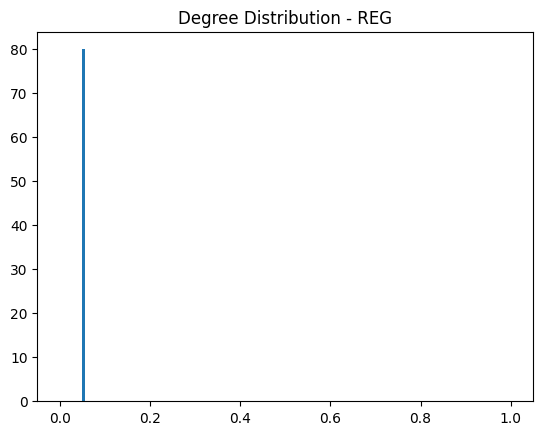

This graph is connected: True
Mean Node Degree for REG(Normalized): 0.05063291139240507
Mean Node Degree for REG: 4.0
Variance of Node Degree for REG(Normalized): 4.81482486096809e-35
Variance of Node Degree for REG: 0.0


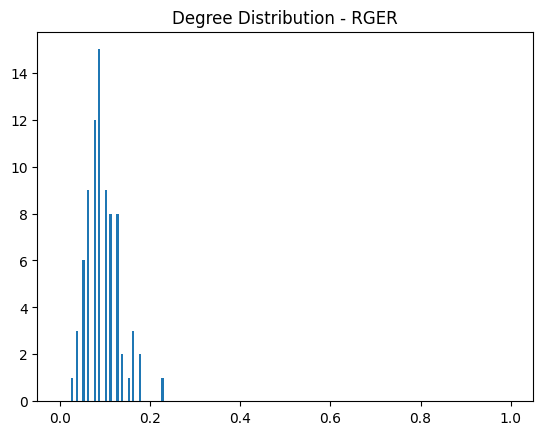

This graph is connected: True
Mean Node Degree for RGER(Normalized): 0.09493670886075949
Mean Node Degree for RGER: 7.5
Variance of Node Degree for RGER(Normalized): 0.001305880467873738
Variance of Node Degree for RGER: 8.15


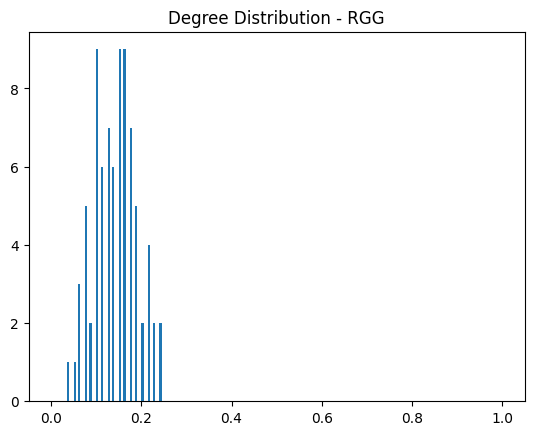

This graph is connected: True
Mean Node Degree for RGG(Normalized): 0.14240506329113925
Mean Node Degree for RGG: 11.25
Variance of Node Degree for RGG(Normalized): 0.002189152379426374
Variance of Node Degree for RGG: 13.6625


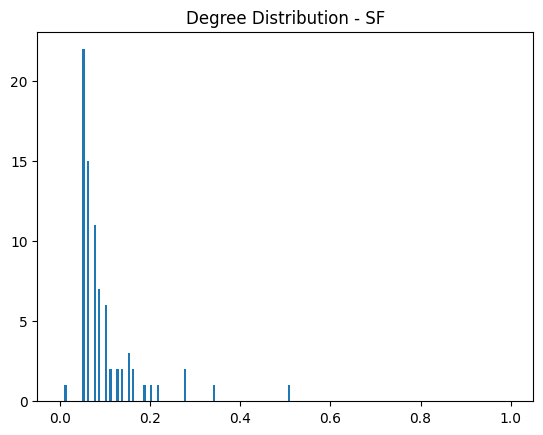

This graph is connected: True
Mean Node Degree for SF(Normalized): 0.09620253164556963
Mean Node Degree for SF: 7.6
Variance of Node Degree for SF(Normalized): 0.005350104149975965
Variance of Node Degree for SF: 33.39


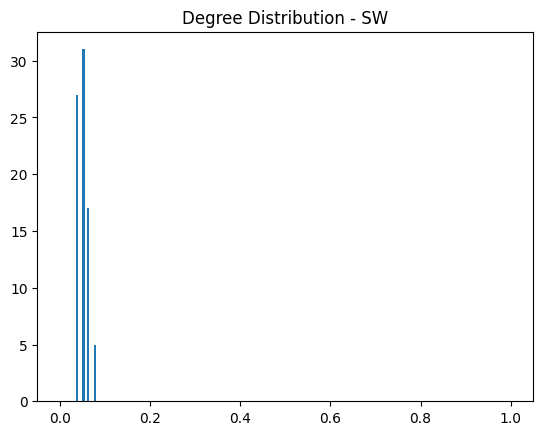

This graph is connected: True
Mean Node Degree for SW(Normalized): 0.05063291139240507
Mean Node Degree for SW: 4.0
Variance of Node Degree for SW(Normalized): 0.00012818458580355713
Variance of Node Degree for SW: 0.8


In [2]:
n=80
d=4
M=300
R=0.25
p=0.3
k=4 # watts_strogatz_graph parameter k for SW network
seedno=5
random.seed(seedno)

# function that returns the degree list in normalized form
def find_degree(G):
    return dict(nx.degree_centrality(G))

def degreeInfo(G, _title, _bins):
    # get degree list
    degree = find_degree(G)
    # create the figure, add title, show plot
    plt.figure()
    plt.title("Degree Distribution - " + _title)
    plt.hist(list(degree.values()), range = (0, 1), bins = _bins)
    plt.show()
    # print if graph is connected or not, mean node degree (normalized and not), variance of node degree (normalized and not)
    print("This graph is connected:", nx.is_connected(G))
    print("Mean Node Degree for " + _title + "(Normalized):", np.mean(np.array(list(degree.values()))))
    print("Mean Node Degree for " + _title + ":", np.mean(np.array(list(dict(nx.degree(G)).values()))))
    print("Variance of Node Degree for " + _title + "(Normalized):", np.var(np.array(list(dict(degree).values()))))
    print("Variance of Node Degree for " + _title + ":", np.var(np.array(list(dict(nx.degree(G)).values()))))

# create all graphs and call degreeInfo
REG = nx.watts_strogatz_graph(n, d, 0, seedno)
degreeInfo(REG, "REG" , 200)
RGER = nx.gnm_random_graph(n, M, seedno)
degreeInfo(RGER, "RGER" , 200)
RGG = nx.random_geometric_graph(n, R, seed = seedno)
degreeInfo(RGG, "RGG" , 200)
SF = nx.barabasi_albert_graph(n, d, seedno)
degreeInfo(SF, "SF" , 200)
SW = nx.watts_strogatz_graph(n, d, p, seedno)
degreeInfo(SW, "SW" , 200)

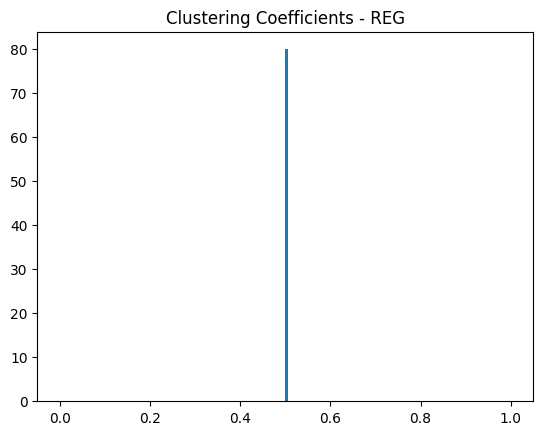

Avg Clustering Coefficient for REG(Normalized): 0.5
Var of Clustering Coefficients for REG(Normalized): 0.0


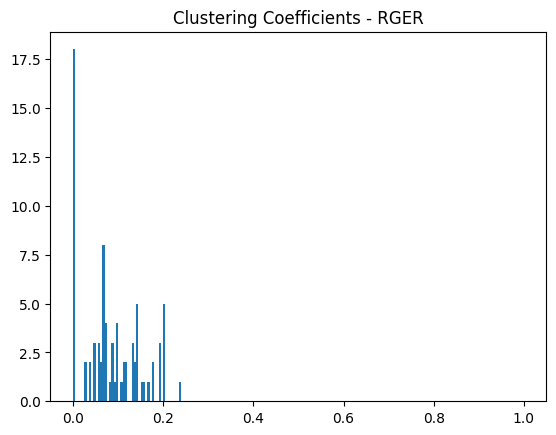

Avg Clustering Coefficient for RGER(Normalized): 0.08497775916893564
Var of Clustering Coefficients for RGER(Normalized): 0.004288874899085844


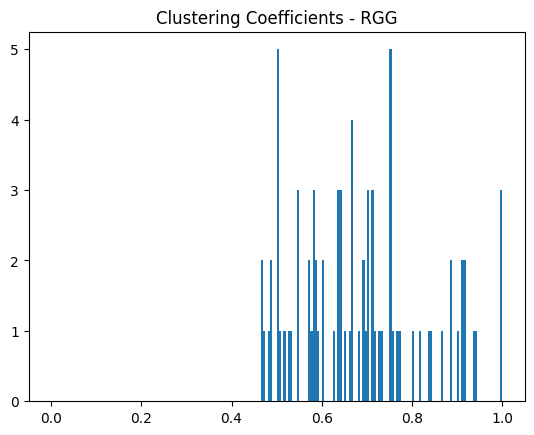

Avg Clustering Coefficient for RGG(Normalized): 0.6825788363897884
Var of Clustering Coefficients for RGG(Normalized): 0.020650408506201083


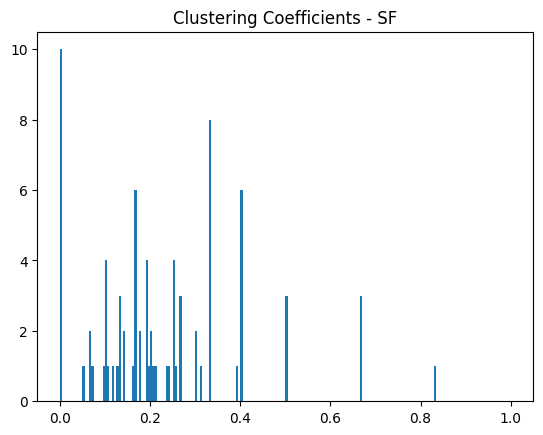

Avg Clustering Coefficient for SF(Normalized): 0.22922761606585143
Var of Clustering Coefficients for SF(Normalized): 0.02892890777065041


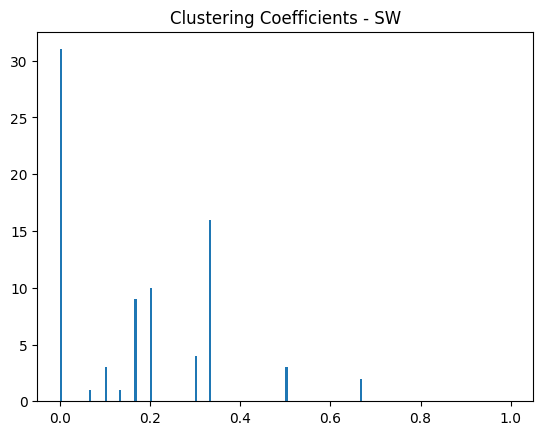

Avg Clustering Coefficient for SW(Normalized): 0.16708333333333333
Var of Clustering Coefficients for SW(Normalized): 0.028069270833333326


In [3]:
# returns clustering coefficient of G and avg clustering coefficient of G (normalized)
def cc_and_avgcc(G):
    return (nx.clustering(G), nx.average_clustering(G))

def ccInfo(G, _title, _bins):
    # get cc and avgcc for G
    (Gcc, Gavgcc) = cc_and_avgcc(G)
    # create the figure, add title, show plot
    plt.figure()
    plt.title("Clustering Coefficients - " + _title)
    plt.hist(list(Gcc.values()), range = (0, 1), bins = _bins)
    plt.show()
    # Convert Gcc dictionary to array (for std)
    Gcc_arr = np.array(list(Gcc.values()))
    # Print avg cc
    print("Avg Clustering Coefficient for " + _title + "(Normalized):", Gavgcc)
    # Print var
    print("Var of Clustering Coefficients for " + _title + "(Normalized):", np.var(Gcc_arr))

ccInfo(REG, "REG" , 200)
ccInfo(RGER, "RGER" , 200)
ccInfo(RGG, "RGG" , 200)
ccInfo(SF, "SF" , 200)
ccInfo(SW, "SW" , 200)

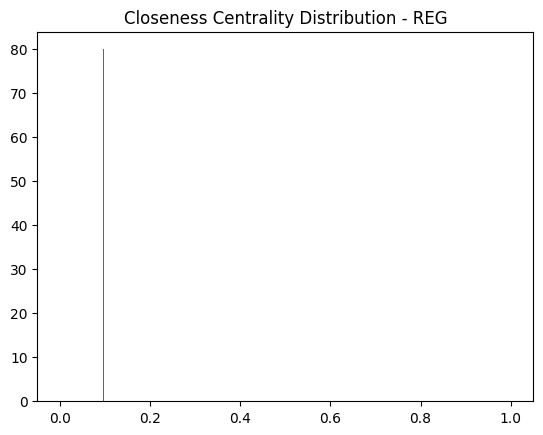

Mean Closeness Centrality for REG(Normalized): 0.09634146341463413
Variance of Closeness Centrality for REG(Normalized): 1.925929944387236e-34


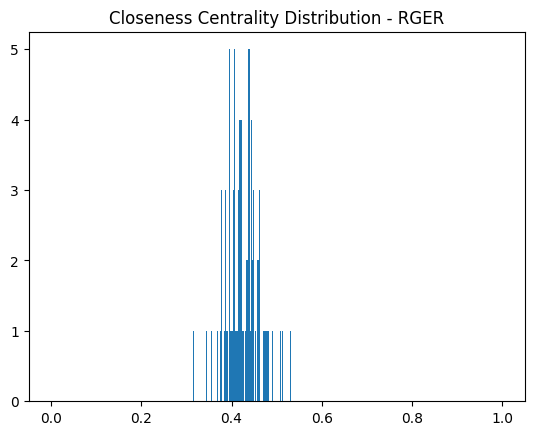

Mean Closeness Centrality for RGER(Normalized): 0.4242297800918761
Variance of Closeness Centrality for RGER(Normalized): 0.0013672367843356472


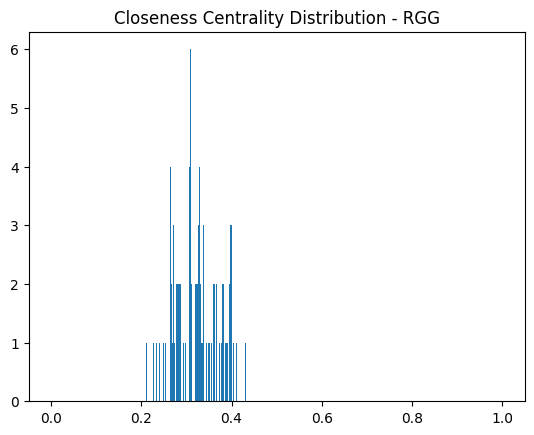

Mean Closeness Centrality for RGG(Normalized): 0.320088016052558
Variance of Closeness Centrality for RGG(Normalized): 0.0023529156049271896


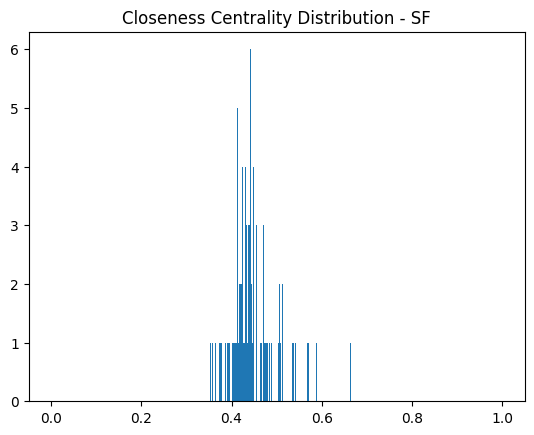

Mean Closeness Centrality for SF(Normalized): 0.4464453837879834
Variance of Closeness Centrality for SF(Normalized): 0.00274403344255402


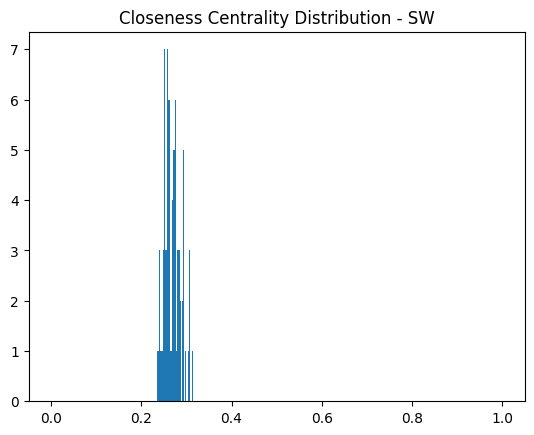

Mean Closeness Centrality for SW(Normalized): 0.26914269896354603
Variance of Closeness Centrality for SW(Normalized): 0.0003201178985869596


In [4]:
def find_closeness(G):
    return nx.closeness_centrality(G)

def closenessInfo(G, _title, _bins):
    # get closeness for G
    closeness = find_closeness(G)
    # create the figure, add title, show plot
    plt.figure()
    plt.title("Closeness Centrality Distribution - " + _title)
    plt.hist(list(closeness.values()), range = (0, 1), bins = _bins)
    plt.show()
    print("Mean Closeness Centrality for " + _title + "(Normalized):", np.mean(np.array(list(closeness.values()))))
    print("Variance of Closeness Centrality for " + _title + "(Normalized):", np.var(np.array(list(closeness.values()))))

closenessInfo(REG, "REG" , 400)
closenessInfo(RGER, "RGER" , 400)
closenessInfo(RGG, "RGG" , 400)
closenessInfo(SF, "SF" , 400)
closenessInfo(SW, "SW" , 400)    

<h4>Εισαγωγή και οπτικοποίηση πραγματικών τοπολογιών.</h4>

### Football Network

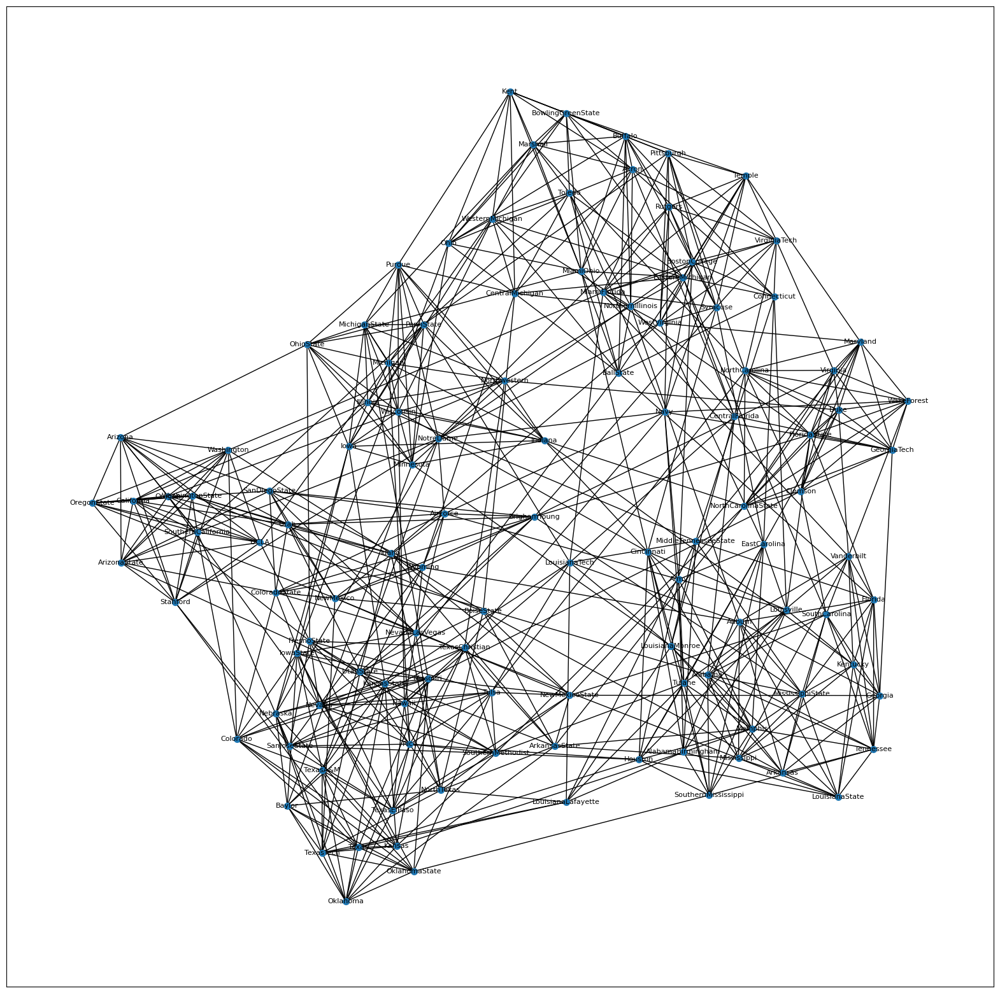

In [6]:
#football network
football=nx.read_gml(r"football.gml")

plt.figure(figsize = (20, 20))
nx.draw_networkx(football, with_labels = True, node_size = 50, font_size = 8)

### Game of Thrones Network

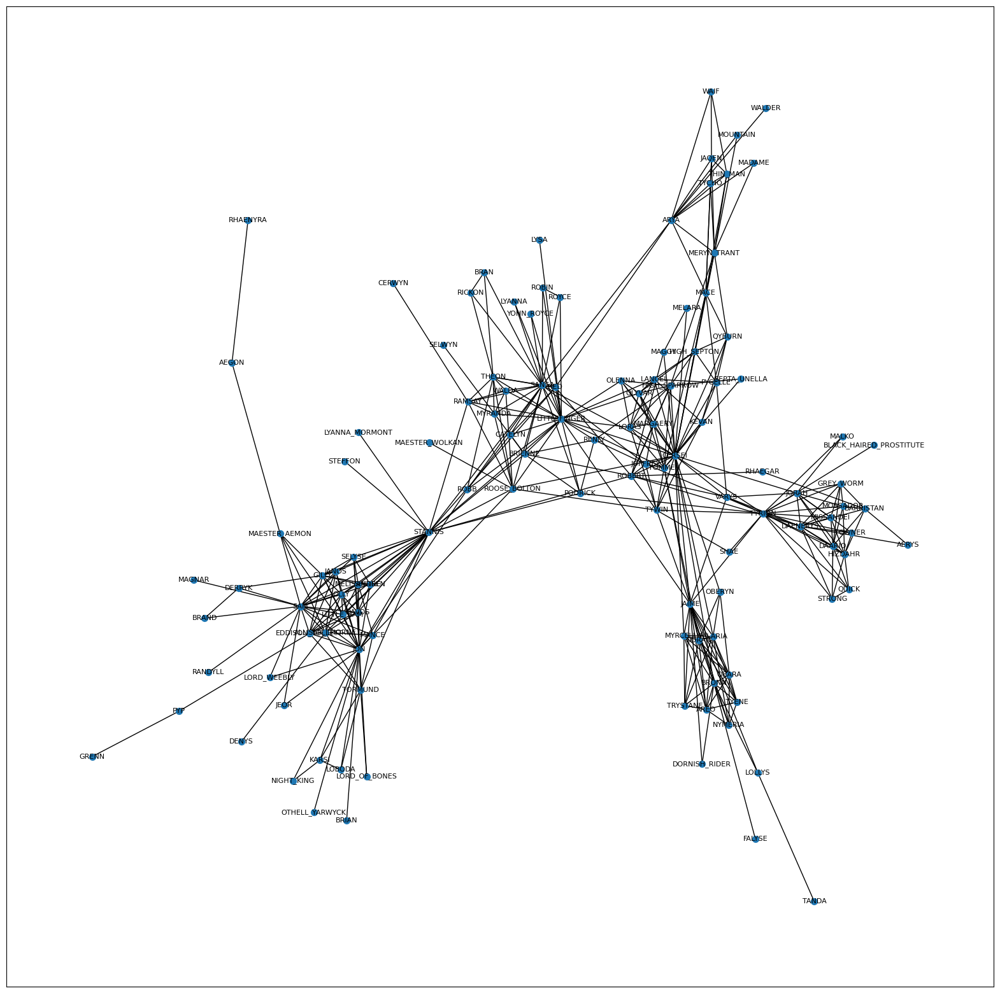

In [7]:
#Game of thrones network
import csv
got=nx.Graph()
with open('got_s5.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    next(csv_reader)
    for row in csv_reader:
        got.add_edge(row[0],row[1])
        line_count += 1


plt.figure(figsize = (20, 20))
nx.draw_networkx(got, with_labels = True, node_size = 50, font_size = 8)

### Email-Eu-core network

#### Προσοχή! Θα μελετήσετε τη μεγαλύτερη συνδεδεμένη συνιστώσα του δικτύου email-Eu-core, αφού πρώτα αφαιρέσετε τα self-loops. Μπορείτε να κάνετε χρήση των συναρτήσεων connected_components, subgraph, remove_edges_from του networkx.

Is email-Eu-core network network connected? False
Is it now connected? True


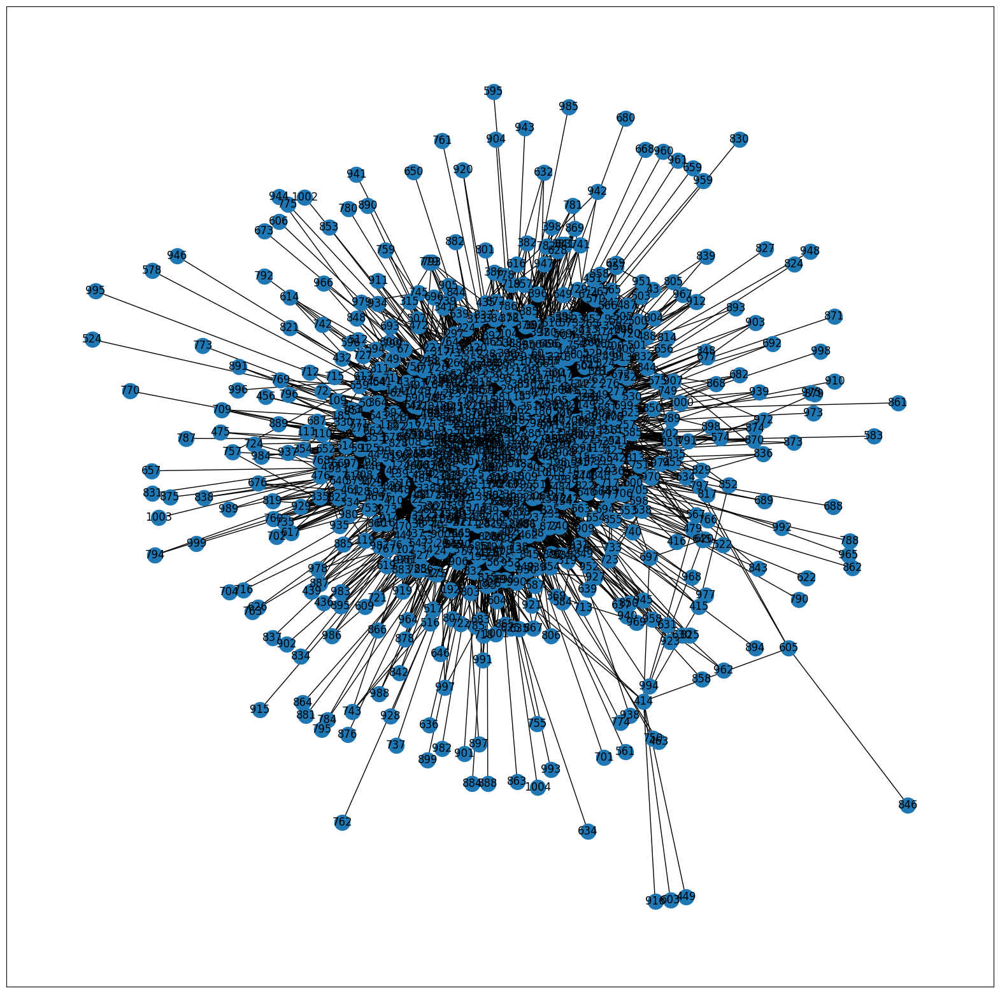

In [8]:
#email-Eu-core network
eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())

print("Is email-Eu-core network network connected?",nx.is_connected(eu))

# remove self loops using remove_edges_from
eu.remove_edges_from(nx.selfloop_edges(eu))
# largest connected component
largest_eu = max(nx.connected_components(eu), key = len)
# eu subgraph
eu_subgraph = eu.subgraph(largest_eu)

print("Is it now connected?",nx.is_connected(eu_subgraph))

# visualize
plt.figure(figsize = (20, 20))
nx.draw_networkx(eu.subgraph(largest_eu))

<h4>Μελέτη βαθμού κόμβου για πραγματικές και συνθετικές τοπολογίες.</h4>

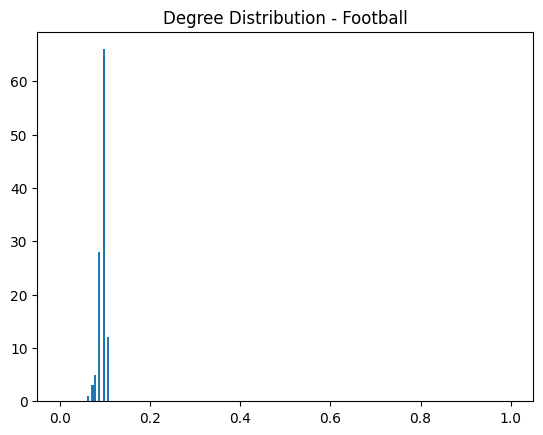

This graph is connected: True
Mean Node Degree for Football(Normalized): 0.0935163996948894
Mean Node Degree for Football: 10.660869565217391
Variance of Node Degree for Football(Normalized): 6.0067922600584965e-05
Variance of Node Degree for Football: 0.7806427221172025


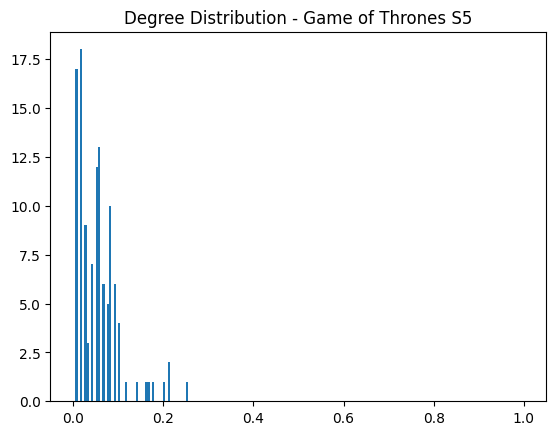

This graph is connected: True
Mean Node Degree for Game of Thrones S5(Normalized): 0.05640222190571145
Mean Node Degree for Game of Thrones S5: 6.65546218487395
Variance of Node Degree for Game of Thrones S5(Normalized): 0.002229916756739365
Variance of Node Degree for Game of Thrones S5: 31.049360920838932


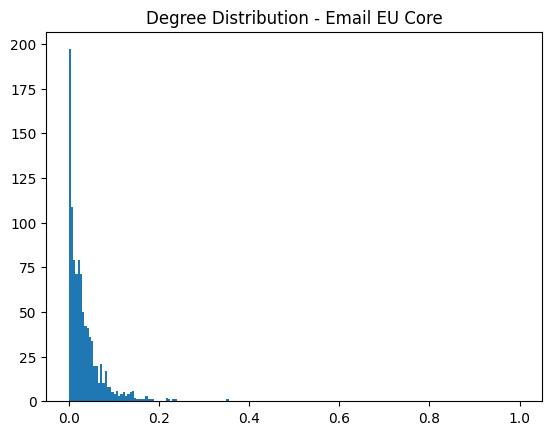

This graph is connected: True
Mean Node Degree for Email EU Core(Normalized): 0.033080384262929745
Mean Node Degree for Email EU Core: 32.5841784989858
Variance of Node Degree for Email EU Core(Normalized): 0.001412958792451516
Variance of Node Degree for Email EU Core: 1370.887944406272


In [9]:
degreeInfo(football, "Football", 200)
degreeInfo(got, "Game of Thrones S5", 200)
degreeInfo(eu_subgraph, "Email EU Core", 200)

<h4>Μελέτη συντελεστή ομαδοποίησης για πραγματικές και συνθετικές τοπολογίες</h4>

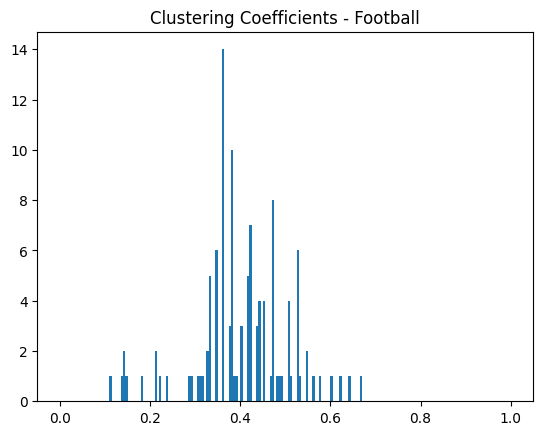

Avg Clustering Coefficient for Football(Normalized): 0.40321601104209814
Var of Clustering Coefficients for Football(Normalized): 0.010767498242611785


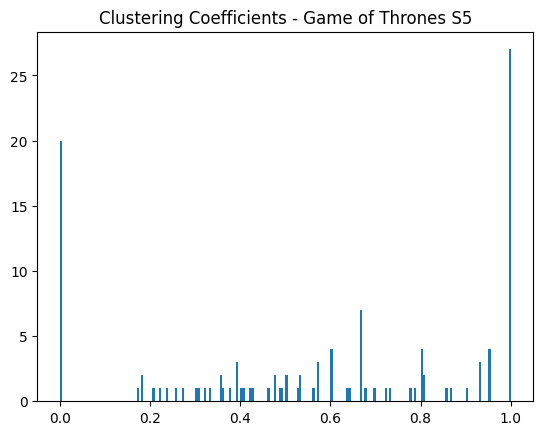

Avg Clustering Coefficient for Game of Thrones S5(Normalized): 0.5744036387164706
Var of Clustering Coefficients for Game of Thrones S5(Normalized): 0.12611105959324512


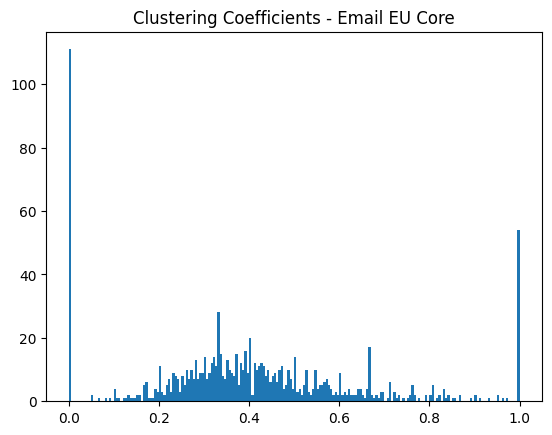

Avg Clustering Coefficient for Email EU Core(Normalized): 0.40705044751953817
Var of Clustering Coefficients for Email EU Core(Normalized): 0.06137235066322143


In [10]:
ccInfo(football, "Football", 200)
ccInfo(got, "Game of Thrones S5", 200)
ccInfo(eu_subgraph, "Email EU Core", 200)

<h4>Μελέτη κεντρικότητας εγγύτητας για πραγματικές και συνθετικές τοπολογίες </h4>

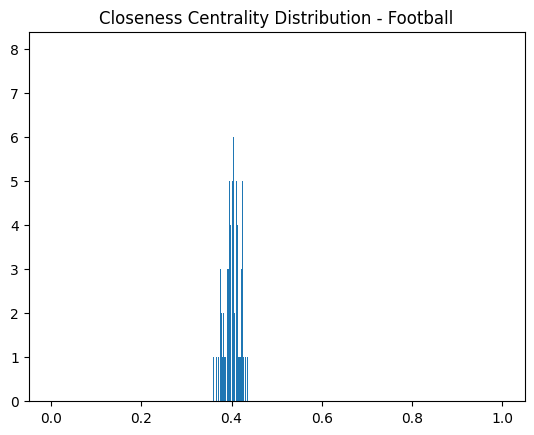

Mean Closeness Centrality for Football(Normalized): 0.39931907825186225
Variance of Closeness Centrality for Football(Normalized): 0.0002461653416156402


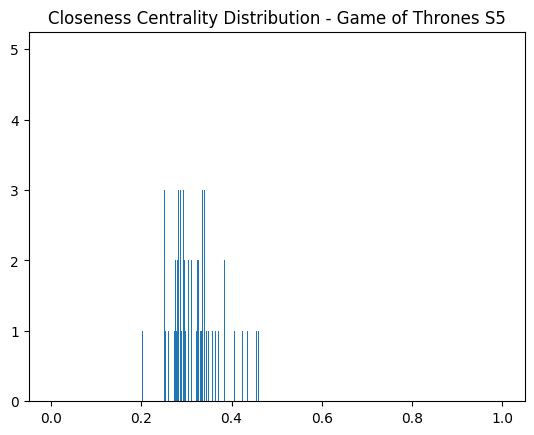

Mean Closeness Centrality for Game of Thrones S5(Normalized): 0.31905170483140755
Variance of Closeness Centrality for Game of Thrones S5(Normalized): 0.002653087706092289


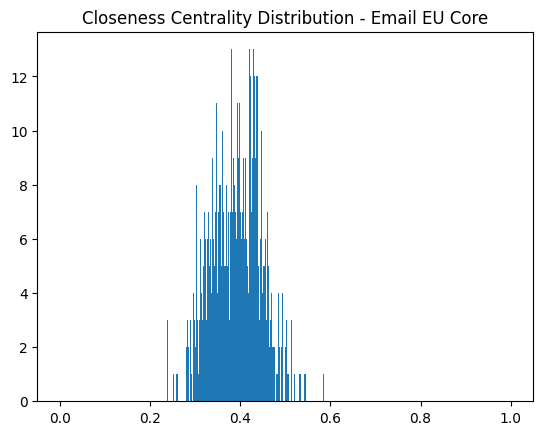

Mean Closeness Centrality for Email EU Core(Normalized): 0.39446404120869627
Variance of Closeness Centrality for Email EU Core(Normalized): 0.002987721202507139


In [11]:
closenessInfo(football, "Football", 800)
closenessInfo(got, "Game of Thrones S5", 800)
closenessInfo(eu_subgraph, "Email EU Core", 800)

#### Σχολιασμός Αποτελεσμάτων Ερωτήματος A

#### Παρατηρήσεις

##### Football
> Ο συγκεκριμένος γράφος φαίνεται να είναι πιο κοντά στη συνθετική τοπολογία RGER, ωστόσο κάποια απο τα χαρακτηριστικά που εμφανίζει τον κάνουν να φαίνεται επίσης σαν RGG. Πιο συγκεκριμένα, ο λόγος που μας οδηγεί στο RGER είναι λόγω της οπτικοποίησης της τοπολογίας καθώς επίσης και από το degree centrality και το closeness centrality της συγκεκριμένης τοπολογίας, που οι τιμές φαίνεται να είναι πολύ κοντινές με τις τιμές του degree centrality και του closeness centrality του συνθετικού γράφου RGER. Το χαρακτηριστικό που φέρνει την παρούσα τοπολογία να μοιάζει με RGG είναι το clustering coefficient, χωρίς ωστόσο να έχει πολλούς κόμβους με μεγάλο συντελεστή ομαδοποίησης. 

##### Game Of Thrones
> Ο συγκεκριμένος γράφος φαίνεται να αντιστοιχεί στον RGG. Αυτό μπορούμε να το συμπεράνουμε αρχικά απο την οπτικοποίηση της τοπολογίας, που έχει ακριβώς την ίδια μορφή με τον συνθετικό γράφο RGG, που παρήχθη στην πρώτη εργαστηριακή άσκηση. Επίσης, τόσο το degree centrality, το closeness centrality αλλά και το clustering coefficient μοιάζουν πάρα πολύ με τις τιμές του συνθετικού γράφου RGG. 

##### EU
> Η τοπολογία αυτή φαίνεται να είναι πιο κοντά σε SF. Αυτό μπορούμε να το συμπεράνουμε τόσο το degree centrality όσο και το closeness centrality που είναι αρκετά κοντά στις τιμές του συνθετικού γράφου SF. Επίσης, οι γραφικές συμβαδίζουν με αυτές του συνθετικού γράφου SF. Ωστόσο, το clustering coefficient αποτελεί εξαίρεση καθώς δεν συμβαδίζει  πολύ με τον συνθετικό γράφο SF σε αυτή την τοπολογία.

<h3>B. Εξοικείωση με τα εργαλεία εντοπισμού κοινοτήτων</h3>
<ol>
<li>Χρησιμοποιώντας τις συναρτήσεις του <b>πίνακα 2</b> για κάθε <u>πραγματικό</u> (<b>πίνακας 1</b>) και <u>συνθετικό</u> (από την <b>άσκηση 1</b>) δίκτυο:</p>
<ol>
    <li>να οπτικοποιηθούν οι κοινότητες που προκύπτουν από την κάθε μέθοδο,</li>
    <li>να γίνουν οι απαραίτητοι σχολιασμοί (π.χ: σύγκριση του αριθμού των κοινοτήτων που υπολογίζει ο κάθε αλγόριθμος).</li>
</ol>
<p>Για την οπτικοποίηση, να επισημανθεί διαφορετικά κάθε κοινότητα, π.χ. με διαφορετικό χρώμα.</p>
<p style=text-align:justify>Στην περίπτωση των συνθετικών δικτύων, να πραγματοποιηθούν συγκρίσεις και μεταξύ των διαφορετικών τύπων τοπολογιών. Για παράδειγμα, στην περίπτωση του τυχαίου γεωμετρικού γράφου, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που δημιουργείται με βάση τις αποστάσεις του τελευταίου από τους υπόλοιπους κόμβους του δικτύου. Στην περίπτωση των scale-free δικτύων, είναι πιθανό να σχηματίζονται κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό.</p>
<li>Για κάθε αλγόριθμο εντοπισμού κοινοτήτων και για κάθε τοπολογία αξιολογήστε την ποιότητα της διαμέρισης με τις μετρικές performance και modularity (<a style=text-decoration:none href='https://networkx.org/documentation/stable/reference/algorithms/community.html#module-networkx.algorithms.community.quality'>measuring_partitions</a>). Για την μετρική performance, θα χρησιμοποιήσετε την συνάρτηση partition_quality του networkx.</li>
<li>Για την μεγαλύτερη συνδεδεμένη συνιστώσα του email-Eu-core, να συγκρίνετε την ground-truth διαμέριση που δίνεται στο αρχείο Email-Eu-core-department-labels.txt με τις διαμερίσεις που προκύπτουν από τις εξεταζόμενες μεθόδους ως προς το πλήθος των παραγόμενων κοινοτήτων και ως προς τις μετρικές performance και modularity. </li>
<li>Για την παρακολούθηση του χρόνου εκτέλεσης της υλοποίησής σας, μπορείτε να χρησιμοποιήσετε την βιβλιοθήκη <a style=text-decoration:none href='https://tqdm.github.io/'>tqdm</a>. Στο σχολιασμό σας να λάβετε υπόψη το trade-off της ποιότητας της διαμέρισης και του χρόνου εκτέλεσης των εξεταζόμενων αλγορίθμων. </li>
</ol>

<table style=float:left;width:70%>
    <caption>Πίνακας <b>2</b>: Συναρτήσεις εντοπισμού κοινοτήτων</caption>
    <tr>
        <th style=text-align:left> Μέθοδος εντοπισμού κοινοτήτων</th>
        <th style=text-align:left>Συνάρτηση</th>
    </tr>
    <tr>
        <td style=text-align:left>Spectral Clustering</td>
        <td style=text-align:left><a style=text-decoration:none href='http://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html'>SpectralClustering</a></td>
    </tr>
       <tr>
        <td style=text-align:left>Newman-Girvan</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html'>girvan_newman</a></td>
    </tr>
    <tr>
        <td style=text-align:left>Modularity Maximization</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html'>greedy_modularity_communities</a></td>
    </tr>
</table>
    

In [ ]:
# i put all the graphs in a list of tuples in order to iterate over them faster
graphs = [
    ("REG", REG, "modularity"),
    ("REG", REG, "performance"),
    ("RGER", RGER, "modularity"),
    ("RGER", RGER, "performance"),
    ("RGG", RGG, "modularity"),
    ("RGG", RGG, "performance"),
    ("SF", SF, "modularity"),
    ("SF", SF, "performance"),
    ("SW", SW, "modularity"),
    ("SW", SW, "performance"),
    ("football", football, "modularity"),
    ("football", football, "performance"),
    ("got", got, "modularity"),
    ("got", got, "performance"),
    ("eu", eu_subgraph, "modularity"),
    ("eu", eu_subgraph, "performance")
]

<p style=text-align:justify>Προτού εφαρμόσετε τις συναρτήσεις εντοπισμού κοινοτήτων μελετήστε προσεκτικά την <b>είσοδο που απαιτούν καθώς και τη μορφή εξόδου που παράγουν.</b></p>

In [24]:
#Χρησιμοποιήστε την συνάρτηση conv2int για να μετατρέψετε τα labels των κόμβων στις πραγματικές τοπολογίες σε integers
def conv2int(G,start_value):
    nG = nx.convert_node_labels_to_integers(G,first_label=start_value)
    G_mapping=dict(enumerate(G.nodes,0))
    return nG,G_mapping

In [25]:
nfootball,football_map = conv2int(football,0)
ngot, got_map = conv2int(got,0)

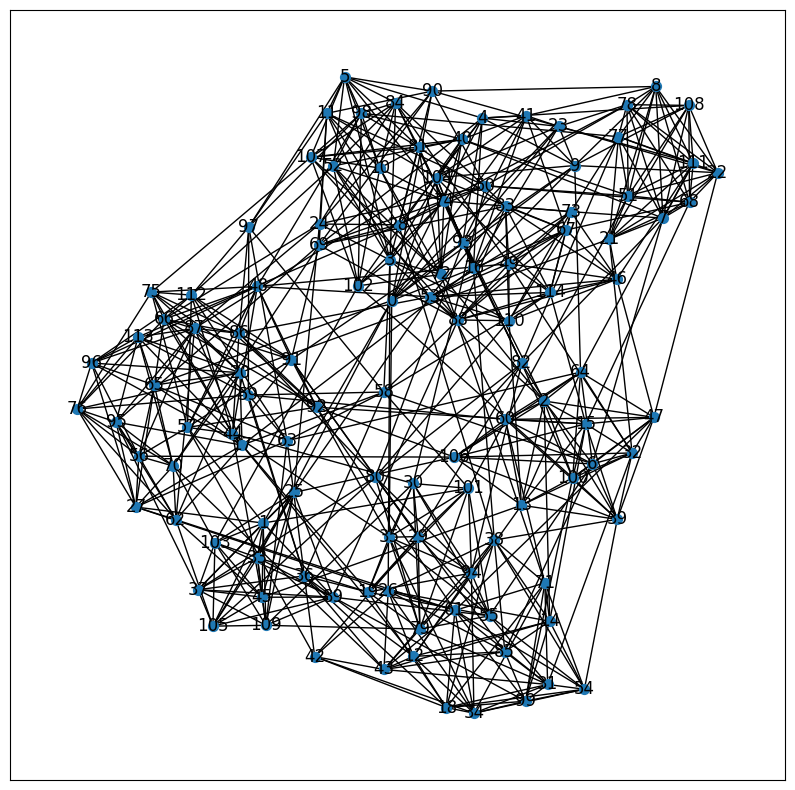

In [26]:
# visualize again football network
plt.figure(figsize = (10, 10))
nx.draw_networkx(nfootball, with_labels = True, node_size = 50, font_size = 12)

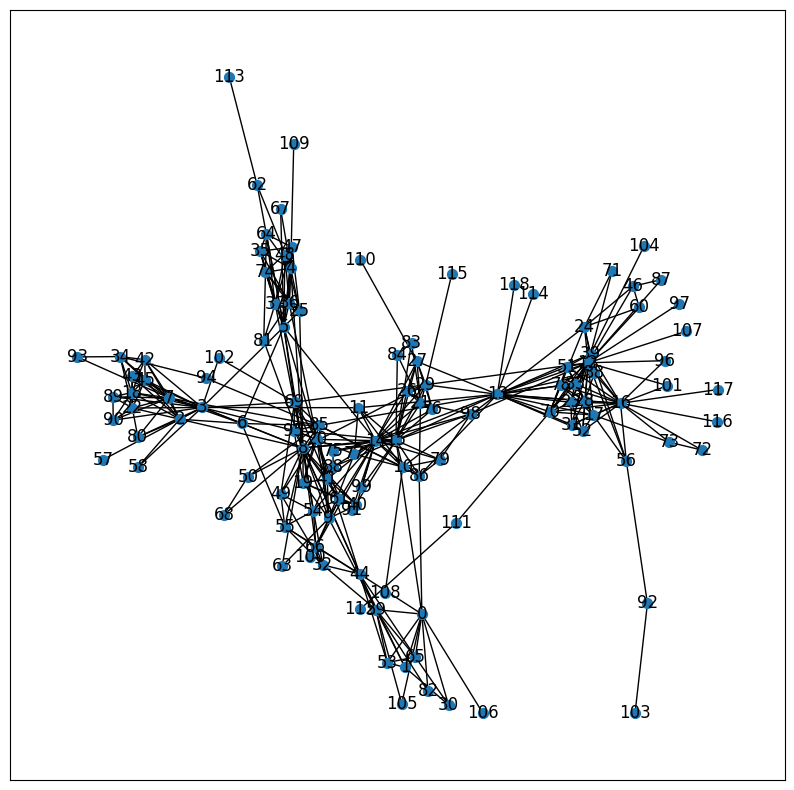

In [44]:
# visualize again got network
plt.figure(figsize = (10, 10))
nx.draw_networkx(ngot, with_labels = True, node_size = 50, font_size = 12)

<h4> Ορισμός χρωμάτων για την οπτικοποίηση των κοινοτήτων.</h4>

In [45]:
#insert colors for nodes
from matplotlib import colors as mcolors
colors = list(dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS).keys())

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Newman-Girvan.</h4>
<p>Παράξτε τις διαμερίσεις που προκύπτουν από την μέθοδο Newman-Girvan. Ελέγξτε τις διαμερίσεις που έχουν μέχρι και 50 κοινότητες.</p>
<p> Επιλέξτε τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

Newman-Girvan

O αλγόριθμος Newman-Girvan εντοπίζει τις κοινότητες σε μία τοπολογία αφαιρώντας ακμές με την υψηλότερη τιμή ενδιαμεσικότητας (betweenness), μέχρι να μην υπάρχουν άλλες ακμές. Η ενδιαμεσικότητα ορίζεται ως ο αριθμός των μικρότερων μονοπατιών ανάμεσα σε ζευγάρια κόμβων που διέρχονται από αυτά. Ο αλγόριθμος ορίζεται ως εξής:

* Υπολογισμός της ενδιαμεσικότητας όλων των ακμών του γράφου
* Αφαίρεση των ακμών με την μέγιστη ενδιαμεσικότητα
* Επαναϋπολογισμός της ενδιαμεσικότητας των ακμών οι οποίες επηρεάστηκαν από την αφαίρεση ακμών του βήματος 3
* Επανάληψη των παραπάνω βημάτων μέχρι να μην υπάρχουν άλλες ακμές

In [46]:
import itertools
from tqdm import tqdm
k = 50

# lists to keep best performance and modularity scores
performanceList = []
modularityList = []

bestCommsNG = {}

def findClusters_NG(G, Gname, metric):
    bestModularity = -1
    bestPerformance = 0

    comp = nx.algorithms.community.centrality.girvan_newman(G)
    limited = itertools.takewhile(lambda c: len(c) < k, comp)

    for communities in limited:
        if metric == "modularity":
            modularity = nx.algorithms.community.quality.modularity(G, communities)
            if modularity > bestModularity:
                bestModularity = modularity
                bestComm = communities
        else:
            performance = nx.algorithms.community.quality.partition_quality(G, communities)[1]
            if performance > bestPerformance:
                bestPerformance = performance
                bestComm = communities
    
    bestCommsNG[Gname + " " + metric] = [list(item) for item in bestComm]

    if metric == "modularity":
        modularityList.append(bestModularity)
        print("Best modularity score for " + Gname + " with Newman Girvan algorithm:", bestModularity)
    else:
        performanceList.append(bestPerformance)
        print("Best performance score for " + Gname + " with Newman Girvan algorithm:", bestPerformance)

In [47]:
for (name, g, metric) in tqdm(graphs):
    findClusters_NG(g, name, metric)

 12%|█▎        | 2/16 [00:00<00:02,  4.77it/s]

Best modularity score for REG with Newman Girvan algorithm: 0.7249999999999999
Best performance score for REG with Newman Girvan algorithm: 0.9696202531645569


 19%|█▉        | 3/16 [00:01<00:08,  1.56it/s]

Best modularity score for RGER with Newman Girvan algorithm: 0.21109444444444445


 25%|██▌       | 4/16 [00:02<00:10,  1.13it/s]

Best performance score for RGER with Newman Girvan algorithm: 0.9215189873417722


 31%|███▏      | 5/16 [00:03<00:10,  1.08it/s]

Best modularity score for RGG with Newman Girvan algorithm: 0.5970493827160495


 38%|███▊      | 6/16 [00:04<00:09,  1.09it/s]

Best performance score for RGG with Newman Girvan algorithm: 0.9291139240506329


 44%|████▍     | 7/16 [00:05<00:08,  1.01it/s]

Best modularity score for SF with Newman Girvan algorithm: 0.13638331024930742


 50%|█████     | 8/16 [00:07<00:08,  1.04s/it]

Best performance score for SF with Newman Girvan algorithm: 0.9174050632911392


 56%|█████▋    | 9/16 [00:07<00:05,  1.25it/s]

Best modularity score for SW with Newman Girvan algorithm: 0.5741015625


 62%|██████▎   | 10/16 [00:07<00:03,  1.57it/s]

Best performance score for SW with Newman Girvan algorithm: 0.9670886075949368


 69%|██████▉   | 11/16 [00:10<00:06,  1.38s/it]

Best modularity score for football with Newman Girvan algorithm: 0.5996290274077957


 75%|███████▌  | 12/16 [00:13<00:07,  1.91s/it]

Best performance score for football with Newman Girvan algorithm: 0.9581998474446987


 81%|████████▏ | 13/16 [00:14<00:05,  1.68s/it]

Best modularity score for got with Newman Girvan algorithm: 0.6681205999387817


 88%|████████▊ | 14/16 [00:16<00:03,  1.53s/it]

Best performance score for got with Newman Girvan algorithm: 0.9641076769690927


 94%|█████████▍| 15/16 [05:10<01:29, 89.75s/it]

Best modularity score for eu with Newman Girvan algorithm: 0.0006218821799455388


100%|██████████| 16/16 [10:29<00:00, 39.35s/it] 

Best performance score for eu with Newman Girvan algorithm: 0.13749034709280175


<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Spectral Clustering. </h4>
Προσοχή! Για την επιλογή της τιμής της παραμέτρου που αφορά στην διάσταση του projection subspace (n_clusters) της συνάρτησης SpectralClustering, θα πρέπει να λάβετε υπόψη το μέγεθος |V| του εκάστοτε δικτύου.
<p>Να εξετάσετε τις διαμερίσεις που προκύπτουν για n_clusters$=2,...,50 Να επιλέξετε για οπτικοποίηση τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

Spectral Clustering

Ο αλγόριθμος Spectral Clustering χρησιμοποιείται ευρύτατα στον εντοπισμό κοινοτήτων σε ένα δίκτυο. Ορίζεται ως εξής:

* Δημιουργείται ένας γράφος ομοιότητας o οποίος έχει την μορφή ενός πίνακα γειτνίασης
* Γίνεται προβολή των δεδομένων σε ένα χώρο μικρότερης διάστασης μέσω του υπολογισμού ενός Graph Laplacian Matrix
* Γίνεται συσταδοποίηση (clustering) των δεδομένων συνήθως με χρήση του αλγορίθμου K-Means Clustering.

In [48]:
bestCommsSC = {}

def findClusters_SC(G, Gname, metric):
    # variables to keep modularity, performance
    bestModularity = -1
    bestPerformance = 0
    nodes = list(G.nodes())
    adjacencyMatrix = nx.to_numpy_array(G)
    for i in range(1, k):
        comm = dict()
        sc = SpectralClustering(n_clusters = i, affinity = "precomputed").fit(adjacencyMatrix)
        for x in np.unique(sc.labels_):
            comm[x] = list()
        for x in range(len(sc.labels_)):
            comm[sc.labels_[x]].append(nodes[x])
        
        if metric == "modularity":
            modularity = nx.algorithms.community.quality.modularity(G, list(comm.values()))
            if (modularity > bestModularity):
                bestModularity = modularity
                bestComm = comm
        else:
            performance = nx.algorithms.community.quality.partition_quality(G, list(comm.values()))[1]
            if (performance > bestPerformance):
                bestPerformance = performance
                bestComm = comm

    bestCommsSC[Gname + " " + metric] = list(bestComm.values())

    if metric == "modularity":
        modularityList.append(bestModularity)
        print("Best modularity score for " + Gname + " with Spectral Clustering algorithm:", bestModularity)
    else:
        performanceList.append(bestPerformance)
        print("Best performance score for " + Gname + " with Spectral Clustering algorithm:", bestPerformance)

In [49]:
for (name, g, metric) in tqdm(graphs):
    findClusters_SC(g, name, metric)

  6%|▋         | 1/16 [00:02<00:36,  2.45s/it]

Best modularity score for REG with Spectral Clustering algorithm: 0.725


 12%|█▎        | 2/16 [00:03<00:24,  1.72s/it]

Best performance score for REG with Spectral Clustering algorithm: 0.9740506329113924


 19%|█▉        | 3/16 [00:04<00:19,  1.52s/it]

Best modularity score for RGER with Spectral Clustering algorithm: 0.2701


 25%|██▌       | 4/16 [00:06<00:17,  1.48s/it]

Best performance score for RGER with Spectral Clustering algorithm: 0.914873417721519


 31%|███▏      | 5/16 [00:07<00:14,  1.31s/it]

Best modularity score for RGG with Spectral Clustering algorithm: 0.6021827160493827


 38%|███▊      | 6/16 [00:08<00:11,  1.17s/it]

Best performance score for RGG with Spectral Clustering algorithm: 0.9401898734177215


 44%|████▍     | 7/16 [00:09<00:09,  1.07s/it]

Best modularity score for SF with Spectral Clustering algorithm: 0.26802177112188363


 50%|█████     | 8/16 [00:10<00:08,  1.01s/it]

Best performance score for SF with Spectral Clustering algorithm: 0.9110759493670886


 56%|█████▋    | 9/16 [00:10<00:06,  1.03it/s]

Best modularity score for SW with Spectral Clustering algorithm: 0.5596289062500001


 62%|██████▎   | 10/16 [00:11<00:05,  1.01it/s]

Best performance score for SW with Spectral Clustering algorithm: 0.9677215189873418


 69%|██████▉   | 11/16 [00:12<00:05,  1.01s/it]

Best modularity score for football with Spectral Clustering algorithm: 0.6022010863056824


 75%|███████▌  | 12/16 [00:14<00:04,  1.18s/it]

Best performance score for football with Spectral Clustering algorithm: 0.9583524027459954


 81%|████████▏ | 13/16 [00:16<00:04,  1.42s/it]

Best modularity score for got with Spectral Clustering algorithm: 0.665416794204673


 88%|████████▊ | 14/16 [00:18<00:03,  1.54s/it]

Best performance score for got with Spectral Clustering algorithm: 0.9480131035465034


 94%|█████████▍| 15/16 [00:40<00:07,  7.73s/it]

Best modularity score for eu with Spectral Clustering algorithm: 0.36412311295468025


100%|██████████| 16/16 [01:02<00:00,  3.90s/it]

Best performance score for eu with Spectral Clustering algorithm: 0.8548738171971046


<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Modularity Maximization.</h4>
Για την διαμέριση που θα προκύψει σε κάθε συνθετικό και πραγματικό δίκτυο, να υπολογίσετε το modularity score και το performance score.

Modularity Maximization

Ο αλγόριθμος Modularity Maximization αποτελεί μια greedy μέθοδο εντοπισμού κοινοτήτων και ορίζεται ως εξής:

* Αρχικά κάθε κόμβος ανήκει σε διαφορετική κοινότητα
* Το ζευγάρι των κόμβων/κοινοτήτων που αν ενωθούν αυξάνουν σε μεγαλύτερο βαθμό το modularity, καθίστανται να ανήκουν στην ίδια κοινότητα.
* Το βήμα 3 επαναλαμβάνεται μέχρι να μένει μόνο μία κοινότητα
* Ο διαχωρισμός με την μεγαλύτερη τιμή του modularity επιλέγεται.

In [50]:
bestCommsMM = {}

def findClusters_MM(G, Gname):
    comp = nx.algorithms.community.modularity_max.greedy_modularity_communities(G)
    modularity = nx.algorithms.community.quality.modularity(G, comp)
    performance = nx.algorithms.community.quality.partition_quality(G, comp)[1]
    bestCommsMM[Gname] = [list(item) for item in comp]
    print("Modularity score for " + Gname + " with Modularity Maximization algorithm:", modularity)
    print("Performance score for " + Gname + " with Modularity Maximization algorithm:", performance)
    modularityList.append(modularity)
    performanceList.append(performance)

In [51]:
for (name, g, metric) in tqdm(graphs):
    if metric == "modularity":
        findClusters_MM(g, name)


 44%|████▍     | 7/16 [00:00<00:00, 54.31it/s]

Modularity score for REG with Modularity Maximization algorithm: 0.673125
Performance score for REG with Modularity Maximization algorithm: 0.8006329113924051
Modularity score for RGER with Modularity Maximization algorithm: 0.28364999999999996
Performance score for RGER with Modularity Maximization algorithm: 0.7591772151898735
Modularity score for RGG with Modularity Maximization algorithm: 0.5853728395061728
Performance score for RGG with Modularity Maximization algorithm: 0.8291139240506329
Modularity score for SF with Modularity Maximization algorithm: 0.27000194771468145
Performance score for SF with Modularity Maximization algorithm: 0.7939873417721519
Modularity score for SW with Modularity Maximization algorithm: 0.563203125
Performance score for SW with Modularity Maximization algorithm: 0.9003164556962026
Modularity score for football with Modularity Maximization algorithm: 0.5564043335134086
Performance score for football with Modularity Maximization algorithm: 0.8684973302

100%|██████████| 16/16 [00:02<00:00,  6.62it/s]

Modularity score for eu with Modularity Maximization algorithm: 0.3471325650460906
Performance score for eu with Modularity Maximization algorithm: 0.7078716240565892


### Σχολιασμός Αποτελεσμάτων

In [53]:
import pandas as pd
print("# of Communities in every topology with different metric")

bestCommsNG_mod_no = [len(v) for (k,v) in bestCommsNG.items() if "modularity" in k]
bestCommsNG_perf_no = [len(v) for (k,v) in bestCommsNG.items() if "performance" in k]
bestCommsSC_mod_no = [len(v) for (k,v) in bestCommsSC.items() if "modularity" in k]
bestCommsSC_perf_no = [len(v) for (k,v) in bestCommsSC.items() if "performance" in k]
bestComms_MM_no = [len(i) for i in list(bestCommsMM.values())]

index = ["Girvan Newman - Modularity", "Girvan Newman - Performance","Spectral Clustering - Modularity", "Spectral Clustering - Performance","Modularity Maximization"]
data = [bestCommsNG_mod_no, bestCommsNG_perf_no, bestCommsSC_mod_no, bestCommsSC_perf_no, bestComms_MM_no]

pd.DataFrame(data, index = index, columns = [graphs[i][0] for i in range(0, len(graphs), 2)])

# of Communities in every topology with different metric


,REG,RGER,RGG,SF,SW,football,got,eu
Girvan Newman - Modularity,8,24,5,30,8,10,8,2
Girvan Newman - Performance,16,34,22,43,31,17,49,49
Spectral Clustering - Modularity,7,10,6,4,9,11,7,10
Spectral Clustering - Performance,22,32,11,27,29,18,26,48
Modularity Maximization,4,4,4,5,8,6,5,8


#### Σχολιασμός Αποτελεσμάτων

* Οι αλγόριθμοι Spectral Clustering με τη μετρική modularity και Modularity Maximization είναι οι μόνοι που επιστρέφουν σχετικά μικρό εύρος τιμών ως αποτελέσματα (δηλαδή, τον αριθμό κοινοτήτων για κάθε τοπολογία).

* Σε κανένα γράφο, οι διάφοροι συνδυασμοί αλγορίθμων και μετρικών δεν παρέχουν κοντινά αποτελέσματα. Αυτό το φαινόμενο είναι ιδιαίτερα έντονο στον γράφο eu, όπου οι κοινότητες που εντοπίζονται από κάθε συνδυασμό αλγορίθμου και μετρικής παρουσιάζουν τη μεγαλύτερη απόκλιση μεταξύ τους.

* Όταν χρησιμοποιείται η μετρική performance σε συνδυασμό με οποιονδήποτε αλγόριθμο, παρατηρείται ότι επιστρέφεται πολύ μεγαλύτερος αριθμός κοινοτήτων σε σύγκριση με άλλες μετρικές.


In [54]:
print("Modularity Score")

GN_mods = modularityList[0:8]
SC_mods = modularityList[8:16]
MM_mods = modularityList[16:]

index = ["Girvan-Newman", "Spectral Clustering","Modularity Max"]

data = [GN_mods, SC_mods, MM_mods]

pd.DataFrame(data, index = index, columns = [graphs[i][0] for i in range(0, len(graphs), 2)])

Modularity Score


,REG,RGER,RGG,SF,SW,football,got,eu
Girvan-Newman,0.725000,0.211094,0.597049,0.136383,0.574102,0.599629,0.668121,0.000622
Spectral Clustering,0.725000,0.270100,0.602183,0.268022,0.559629,0.602201,0.665417,0.364123
Modularity Max,0.673125,0.283650,0.585373,0.270002,0.563203,0.556404,0.660478,0.347133


#### Σχολιασμός Αποτελεσμάτων


* Η τοπολογία SF παρουσιάζει κατά μέσο όρο τις χειρότερες επιδόσεις σε σύγκριση με τις υπόλοιπες τοπολογίες.

* Η χαμηλότερη τιμή modularity καταγράφεται στην τοπολογία eu όταν χρησιμοποιείται ο αλγόριθμος Girvan-Newman.

* Οι αλγόριθμοι Spectral Clustering και Modularity Max αποδίδουν συνολικά καλύτερα από τον Girvan-Newman. Αν και σε ορισμένες περιπτώσεις ο Girvan-Newman μπορεί να υπερτερεί ελαφρώς, οι συνολικές επιδόσεις του είναι κατά μέσο όρο χειρότερες.

* Ο αλγόριθμος Girvan-Newman απαιτεί πολύ περισσότερο χρόνο εκτέλεσης, πολλές τάξεις μεγέθους περισσότερο από τους άλλους δύο αλγόριθμους. Λαμβάνοντας υπόψη ότι τα αποτελέσματά του δεν είναι αισθητά καλύτερα (αλλά τις περισσότερες φορές χειρότερα), μπορεί εύκολα να συμπεράνει κανείς ότι η χρήση του δεν είναι ιδιαίτερα αποδοτική.

* Η τοπολογία REG παρουσιάζει τις υψηλότερες τιμές modularity, κάτι αναμενόμενο, καθώς όλοι οι κόμβοι έχουν τον ίδιο βαθμό και πανομοιότυπη τοπολογία στο δίκτυο. Έτσι, οι διαμερίσεις που προκύπτουν από διαδοχικούς κόμβους παρέχουν σταθερά καλά αποτελέσματα.

* Η τοπολογία RGG εμφανίζει τις δεύτερες υψηλότερες τιμές modularity μεταξύ των συνθετικών γράφων, κάτι που επίσης είναι αναμενόμενο, καθώς η φύση αυτής της τοπολογίας δημιουργεί  διακριτές κοινότητες.

* Εξετάζοντας τα αποτελέσματα του πρώτου μέρους, όπου ζητήθηκε η αναγνώριση των τριών τοπολογιών football, got και eu, φαίνεται ότι οι τρεις αναγνωρίσεις είναι πιθανότατα σωστές, βάσει των εξής παρατηρήσεων:

    * Οι τιμές της τοπολογίας football μοιάζουν με εκείνες της τοπολογίας RGG.
    * Οι τιμές της τοπολογίας got μοιάζουν με εκείνες της τοπολογίας RGG.
    * Οι τιμές της τοπολογίας eu είναι παρόμοιες με αυτές της τοπολογίας SF.

In [55]:
print("Performance Score")

GN_perf = performanceList[0:8]
SC_perf = performanceList[8:16]
MM_perf = performanceList[16:]

data = [GN_perf, SC_perf, MM_perf]

pd.DataFrame(data, index = index, columns = [graphs[i][0] for i in range(0, len(graphs), 2)])

Performance Score


,REG,RGER,RGG,SF,SW,football,got,eu
Girvan-Newman,0.969620,0.921519,0.929114,0.917405,0.967089,0.958200,0.964108,0.137490
Spectral Clustering,0.974051,0.914873,0.940190,0.911076,0.967722,0.958352,0.948013,0.854874
Modularity Max,0.800633,0.759177,0.829114,0.793987,0.900316,0.868497,0.829796,0.707872


#### Σχολιασμός Αποτελεσμάτων

* Η τοπολογία eu παρουσιάζει τις χειρότερες τιμές σε σύγκριση με τις υπόλοιπες τοπολογίες.

* Ο αλγόριθμος Modularity Max έχει συνολικά τη χειρότερη απόδοση συγκριτικά με τους άλλους δύο αλγορίθμους.

* Ο Spectral Clustering εμφανίζει τις καλύτερες επιδόσεις. Αν και σε ορισμένες τοπολογίες ο Girvan-Newman μπορεί να αποδίδει ελαφρώς καλύτερα, ο χρόνος εκτέλεσης του είναι πολύ μεγαλύτερος, χωρίς να προσφέρει σημαντικά πλεονεκτήματα. Έτσι, η χρήση του Girvan-Newman δεν θεωρείται αποδοτική.

* Στη μετρική performance, ο συνθετικός γράφος RGG εμφανίζει από τις καλύτερες επιδόσεις και για τους τρεις αλγόριθμους. Αυτό πιθανότατα οφείλεται στο ότι η συγκεκριμένη τοπολογία διαμορφώνει  διακριτές κοινότητες.

* Επιπλέον, οι τιμές των τοπολογιών football και got είναι αρκετά κοντά σε αυτές του συνθετικού γράφου RGG, γεγονός που ενισχύει την υπόθεση ότι αυτές οι τοπολογίες έχουν στοιχεία τοπολογίας RGG.

#### Γενικά Συμπεράσματα

**Girvan-Newman**	

_Σχετικά με τον αριθμό των κοινοτήτων_  
- Το modularity δίνει λιγότερες και πιο πυκνές κοινότητες.  
- Το performance ευνοεί περισσότερες διαμερίσεις.  

_Σχετικά με το μέγιστο modularity_  
- Πραγματικές τοπολογίες:  
  - Το eu έχει τη χαμηλότερη τιμή.  
  - Τα football και got έχουν παρόμοιες τιμές.  
- Συνθετικές τοπολογίες:  
  - Το RGG έχει το υψηλότερο modularity.  
  - Το SF έχει το χαμηλότερο modularity.  

_Σχετικά με το μέγιστο performance_  
- Πραγματικές τοπολογίες:  
  - Το eu έχει την χαμηλότερη απόδοση.  
- Συνθετικές τοπολογίες:  
  - Το RGG έχει την υψηλότερη απόδοση.  
  - Τα RGER και SF έχουν την χαμηλότερη απόδοση.  

_Σχετικά με τον χρόνο εκτέλεσης_  
- Πραγματικές τοπολογίες:  
  - Το got είναι ταχύτερο λόγω λιγότερων κόμβων.  
  - Το eu είναι πιο αργό λόγω πολλών κόμβων.  
- Συνθετικές τοπολογίες:  
  - Παρόμοιοι χρόνοι, με μικρές διαφορές λόγω δομής.  

*Η υψηλή ποιότητα διαμέρισης αυξάνει τον χρόνο εκτέλεσης.*

**Spectral Clustering**

_Σχετικά με τον αριθμό των κοινοτήτων_  
- Το modularity δίνει λιγότερες κοινότητες σε σύγκριση με το performance.  

_Σχετικά με το μέγιστο modularity_  
- Πραγματικές τοπολογίες:  
  - Το eu network έχει τη χαμηλότερη τιμή.  
- Συνθετικές τοπολογίες:  
  - Ο REG έχει το υψηλότερο modularity.  
  - Το SF έχει το χαμηλότερο modularity.  

_Σχετικά με το μέγιστο performance_  
- Πραγματικές τοπολογίες:  
  - Το eu network έχει την χαμηλότερη τιμή, αλλά πιο κοντά στις υπόλοιπες τοπολογίες.  
- Συνθετικές τοπολογίες:  
  - Το REG έχει την υψηλότερη τιμή.  
  - Τα RGER, RGG και SF έχουν την χαμηλότερη τιμή.  

_Σχετικά με τον χρόνο εκτέλεσης_  
- Πραγματικές τοπολογίες:  
  - Το eu network έχει μεγαλύτερο χρόνο εκτέλεσης, αλλά με μικρότερη διαφορά από άλλες τοπολογίες.  
  - Ο spectral clustering είναι ταχύτερος από τον newman-girvan.  
- Συνθετικές τοπολογίες:  
  - Παρόμοιοι χρόνοι μεταξύ τους, μεγαλύτεροι από τη μέθοδο Newman-Girvan και πιο κοντά στους χρόνους των πραγματικών τοπολογιών.  
 
**Modularity Max**
 
_Σχετικά με το modularity-performance_
- Για τις πραγματικές τοπολογίες παρατηρούμε το performance έχει τιμή σχετικά κοντά στο 1 το οποίο σημαίνει ότι έχουμε πολύ καλή απόδοση στις πραγματικές τοπολογίες με χρήση του modularity maximization. Αντίστοιχα αποτελέσματα έχουμε και για τις συνθετικές τοπολογίες με πολύ μεγάλο performance και μικρότερο modularity.

_Σχετικά με τον χρόνο εκτέλεσης_ 
- Ο χρόνος εκτέλεσης είναι ο χαμηλότερος από τους 3 αλγορίθμους, πράγμα που περιμέναμε καθώς είναι greedy.


### Προεργασία Οπτικοποίησης Κοινοτήτων

In [126]:
def visualize_community(G, nodes, pos, axis):
    nx.draw_networkx_edges(G, pos = pos, ax = axis, alpha = 0.5)
    for (nodes, i) in zip(nodes, range(len(nodes))):
        n = nx.draw_networkx_nodes(G, pos = pos, node_size = 45, nodelist = nodes, node_color = colors[i-10], ax = axis)
        n.set_edgecolor("black")
        

In [127]:
def showPlots(G, Gname):
    # create subplots
    fig, axes = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 15))
    fig.suptitle(Gname, fontsize = 40)
    ax = axes.flatten()
    # hide 6th subplot (not needed)
    ax[5].set_visible(False) 

    # add title to each subplot
    ax[0].set_title('Newman-Girvan with best modularity score (communities: ' + str(len(bestCommsNG[Gname + " modularity"])) + ')')
    ax[1].set_title('Newman-Girvanwith best performance score (communities: ' + str(len(bestCommsNG[Gname + " performance"])) + ')')
    ax[2].set_title('Spectral Clustering with best modularity score (communities: ' + str(len(bestCommsSC[Gname + " modularity"])) + ')')
    ax[3].set_title('Spectral Clustering with best performance score (communities: ' + str(len(bestCommsSC[Gname + " performance"])) + ')')
    ax[4].set_title('Modularity Max (communities: ' + str(len(bestCommsMM[Gname])) + ')')

    # visualize each community
    visualize_community(G, bestCommsNG[Gname + " modularity"], nx.fruchterman_reingold_layout(G), ax[0])
    visualize_community(G, bestCommsNG[Gname + " performance"], nx.fruchterman_reingold_layout(G), ax[1])
    visualize_community(G, bestCommsSC[Gname + " modularity"], nx.fruchterman_reingold_layout(G), ax[2])
    visualize_community(G, bestCommsSC[Gname + " performance"], nx.fruchterman_reingold_layout(G), ax[3])
    visualize_community(G, bestCommsMM[Gname], nx.fruchterman_reingold_layout(G), ax[4])
    plt.show()

#### Οπτικοποίηση κοινοτήτων American College Football

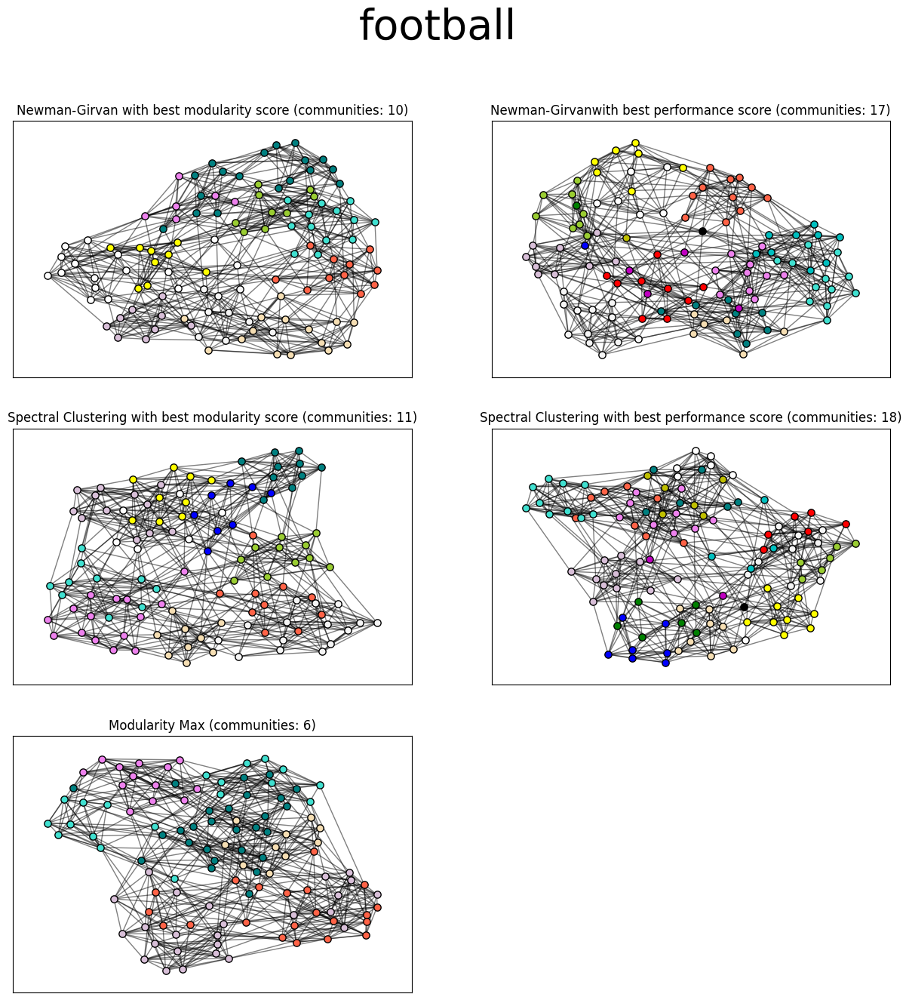

In [128]:
showPlots(football, "football")

#### Σχολιασμός Αποτελεσμάτων

Ο συγκεκριμένος γράφος περιλαμβάνει 12 κοινότητες, όπως προκύπτει από το [σύνδεσμο](https://snap.stanford.edu/agm/?fbclid=IwAR3tBPWGVIXp9ZXuV01NApZfugV7Uz3rpEqpWiNB8ws2LB1Umdj4Orko3lo). Παρ' όλα αυτά, καμία από τις εφαρμογές αλγορίθμων δεν κατάφερε να εντοπίσει και τις 12 κοινότητες.

Παρατηρείται ωστόσο ότι ορισμένες κοινότητες αναγνωρίζονται από όλους τους αλγόριθμους. Σύμφωνα με την οπτικοποίηση, ο αλγόριθμος με τη χαμηλότερη απόδοση φαίνεται να είναι ο Spectral Clustering - performance, ο οποίος παρουσιάζει τη μεγαλύτερη απόκλιση από την πραγματική διαμέριση.

#### Οπτικοποίηση κοινοτήτων Game of Thrones

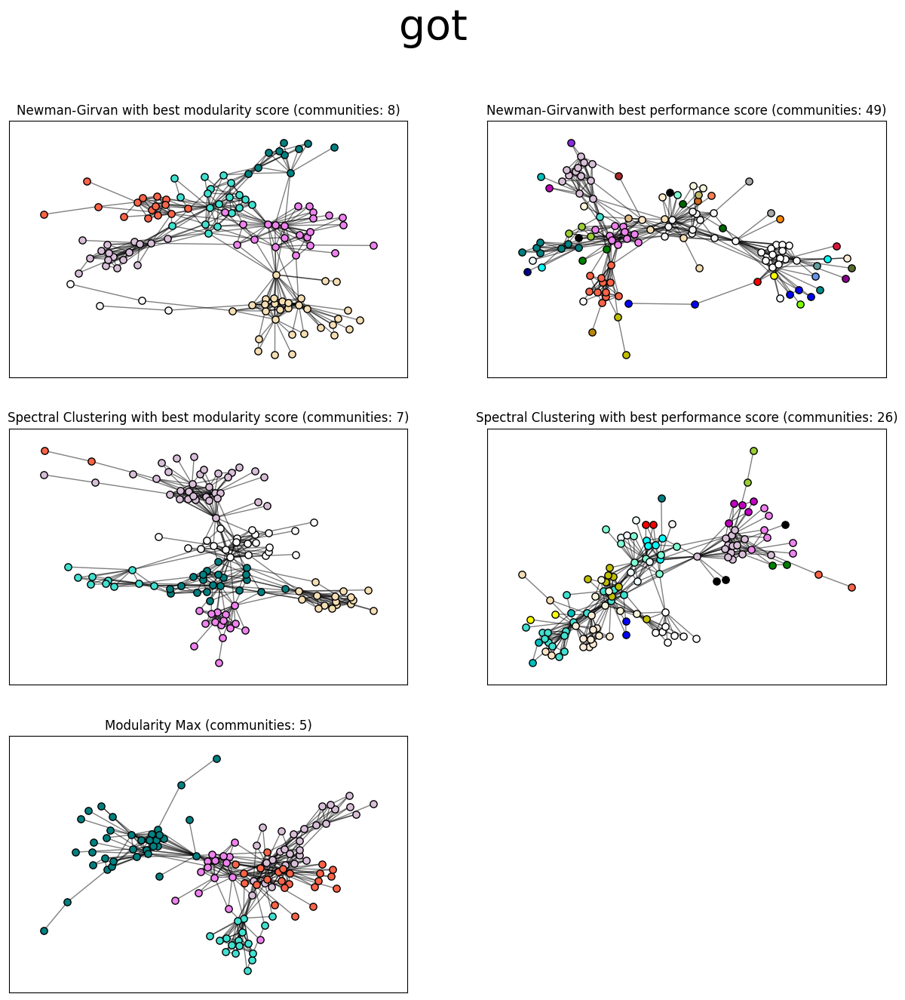

In [129]:
showPlots(got, "got")

#### Σχολιασμός Αποτελεσμάτων

Ο συγκεκριμένος γράφος περιλαμβάνει 6 κοινότητες και επιβεβαιώνεται από τον εξής [σύνδεσμο](https://networkofthrones.com/the-series/season-5/). Από τις οπτικοποιήσεις που παρουσιάζονται, διαπιστώνεται ότι κανένας συνδυασμός αλγορίθμου και μετρικής δεν κατάφερε να εντοπίσει ακριβώς αυτές τις 6 κοινότητες.

Παρόλα αυτά, οι Modularity Max και Spectral Clustering - modularity φαίνεται να πλησιάζουν περισσότερο, διαχωρίζοντας τους κόμβους σε αποδεκτές κοινότητες, οι οποίες μοιάζουν αρκετά με τις αναμενόμενες κοινότητες όπως παρουσιάζονται στην παραπάνω ιστοσελίδα.

Αντίθετα, όλοι οι αλγόριθμοι που βασίζονται στη μετρική performance εμφανίζουν σημαντική απόκλιση, καθώς παράγουν υπερβολικά μεγάλο αριθμό κοινοτήτων, γεγονός που τους καθιστά λιγότερο αξιόπιστους για αυτή την ανάλυση.

#### Οπτικοποίηση κοινοτήτων email-Eu-core (να οπτικοποιηθεί και η ground-truth διαμέριση)

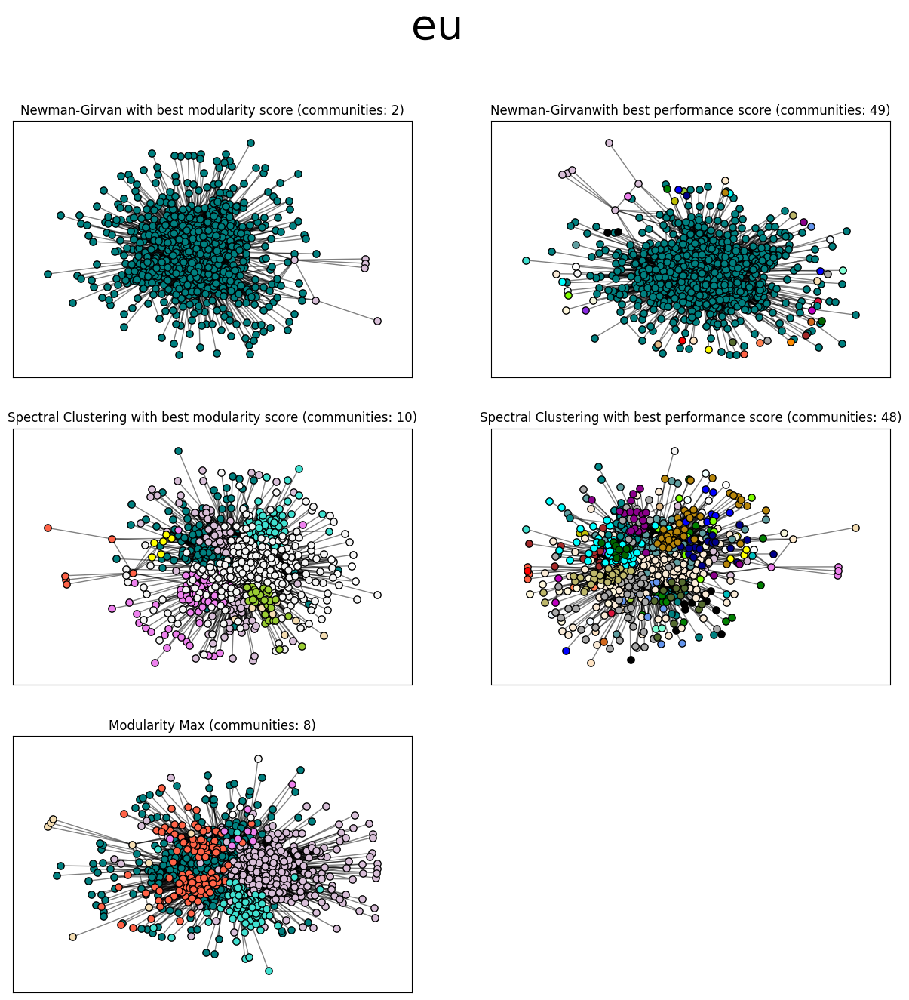

In [130]:
showPlots(eu_subgraph, "eu")

#### Σχολιασμός Αποτελεσμάτων

Σύμφωνα με τη ground truth διαμέριση, γνωρίζουμε ότι η μεγαλύτερη συνεκτική συνιστώσα του γράφου eu περιλαμβάνει 42 κοινότητες. Ο μόνος συνδυασμός αλγορίθμου και μετρικής που προσεγγίζει αυτό τον αριθμό είναι ο Spectral Clustering με μετρική performance, ο οποίος εντοπίζει 48 κοινότητες.

Οι παραπάνω οπτικοποιήσεις παρουσιάζουν δυσκολίες στην εξαγωγή σαφών παρατηρήσεων, λόγω της συγκέντρωσης όλων των κόμβων στο κέντρο. Ωστόσο, αν συγκρίνουμε την οπτικοποίηση του Spectral Clustering - performance με τη διαμέριση της ground truth, φαίνεται πως αυτή η προσέγγιση δίνει τα πιο κοντινά αποτελέσματα.

Αντίθετα, οι αλγόριθμοι Girvan-Newman - modularity, Spectral Clustering - modularity και Modularity Max εμφανίζουν τα χειρότερα αποτελέσματα, καθώς επιστρέφουν σημαντικά λιγότερες κοινότητες συγκριτικά με τη διαμέριση της ground truth.

#### Οπτικοποίηση  Ground-Truth διαμέρισης

Modularity Score of Ground Truth partition 0.28801318862374214
Performance Score of Ground Truth partition 0.9428136036490563


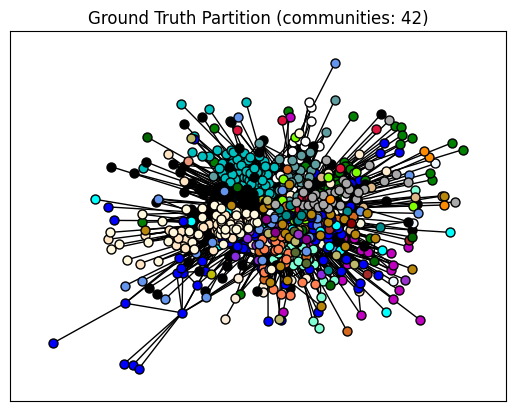

In [133]:
comms = {}

with open("email-Eu-core-department-labels.txt") as file:
    for l in file:
        x = l.split(' ')
        nodeNumber = str(x[0])
        commNumber = str(x[1])
        if (nodeNumber in eu_subgraph.nodes):
            if (commNumber not in comms.keys()):
                comms[commNumber] = []
            comms[commNumber].append(nodeNumber)

ground_truth_mod = nx.algorithms.community.quality.modularity(eu_subgraph, comms.values())
ground_truth_perf = nx.algorithms.community.quality.partition_quality(eu_subgraph, comms.values())[1]

ground_truth = comms.values()

print("Modularity Score of Ground Truth partition", ground_truth_mod)
print("Performance Score of Ground Truth partition", ground_truth_perf)

plt.title('Ground Truth Partition (communities: ' + str(len(ground_truth)) + ')')
pos = nx.fruchterman_reingold_layout(eu_subgraph)
nx.draw_networkx_edges(eu_subgraph, pos = pos)
for (nodes, i) in zip(ground_truth, range(len(ground_truth))):
    n = nx.draw_networkx_nodes(eu_subgraph, pos = pos, node_size = 42, nodelist = nodes, node_color = colors[i])
    n.set_edgecolor("black")

<p> Σύγκριση της Ground Truth διαμέρισης με τα αποτελέσματα των αλγορίθμων </p>

In [134]:
data = []
data.append([modularityList[7], modularityList[15], modularityList[23], ground_truth_mod])
data.append([performanceList[7], performanceList[15], performanceList[23], ground_truth_perf])
pd.DataFrame(data, index = ["Modularity", "Performance"], columns = ["Girvan-Newman", "Spectral Clustering", "Modularity Max", "Ground Truth"])

,Girvan-Newman,Spectral Clustering,Modularity Max,Ground Truth
Modularity,0.000622,0.364123,0.347133,0.288013
Performance,0.137490,0.854874,0.707872,0.942814


#### Σχολιασμός Αποτελεσμάτων

* Η ground truth διαμέριση περιλαμβάνει 42 κοινότητες, ωστόσο κανένας συνδυασμός αλγορίθμου-μετρικής δεν κατάφερε να δώσει αυτό το αποτέλεσμα.

* Στη μετρική performance, μόνο ο αλγόριθμος Spectral Clustering πλησιάζει το επιθυμητό αποτέλεσμα.

* Οι δύο αλγόριθμοι που επιτυγχάνουν τα καλύτερα αποτελέσματα όσον αφορά τη μετρική modularity είναι οι Spectral Clustering και Modularity Max.

* Ο Girvan-Newman, για ακόμη μία φορά, παρουσιάζει τα χειρότερα αποτελέσματα σε σχέση με τους υπόλοιπους αλγόριθμους, καθιστώντας τον μεγάλο χρόνο αναμονής του μη αποδοτικό.

#### Οπτικοποίηση κοινοτήτων REG

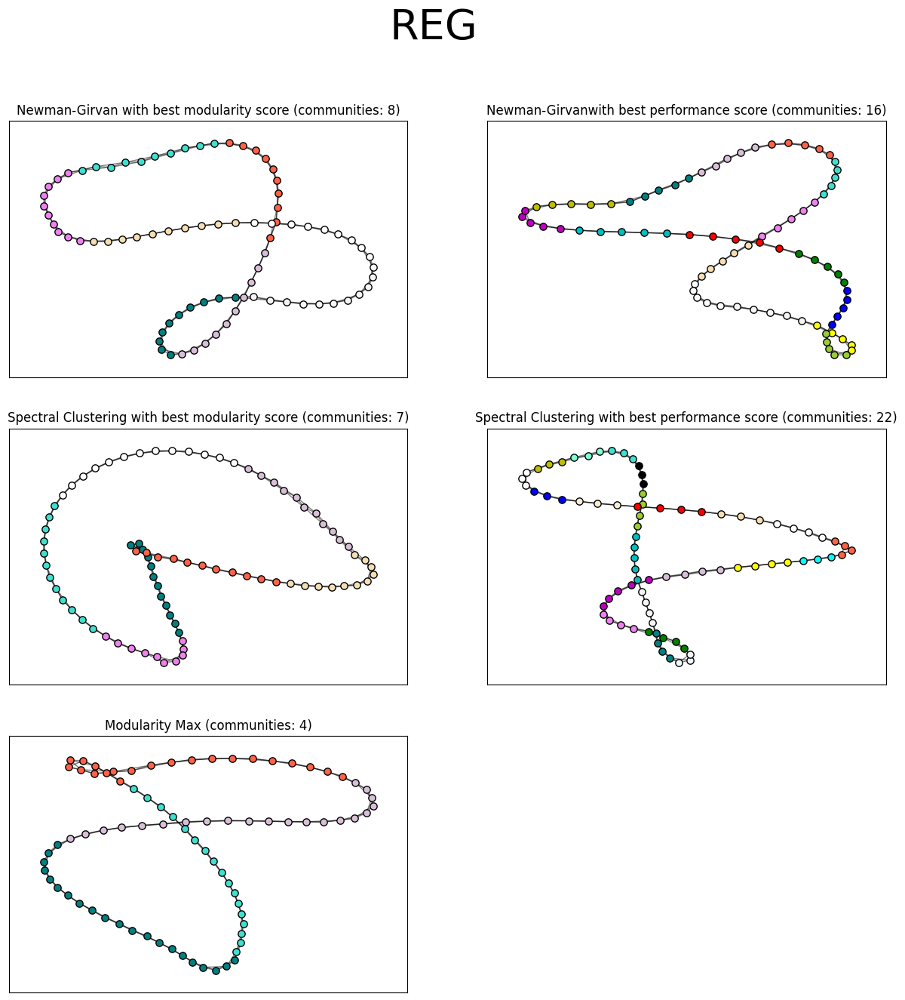

In [135]:
showPlots(REG, "REG")

#### Σχολιασμός Αποτελεσμάτων

Στην περίπτωση του γράφου REG βλέπουμε ότι σε κάθε περίπτωση ο γράφος χωρίζεται σε κοινότητες με ίδιο πλήθος κόμβων (πέρα από την περίπτωση του spectral clustering κατά την μεγιστοποίηση του performance score όπου ο γράφος χωρίζεται σε τριάδες και τετράδες), κάτι το οποίο αναμέναμε αφού κάθε κόμβος συνδέεται με δύο μόνο γειτονικούς κόμβους.

#### Οπτικοποίηση κοινοτήτων RGER

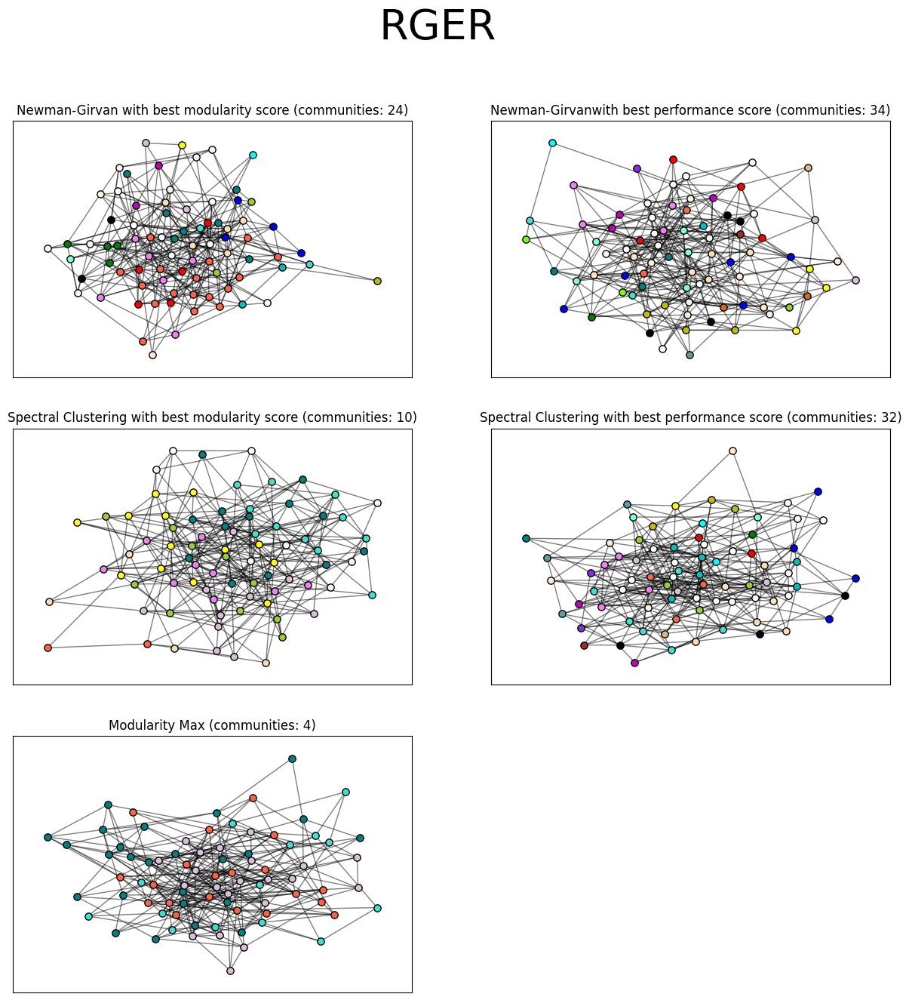

In [136]:
showPlots(RGER, "RGER")

#### Σχολιασμός Αποτελεσμάτων

Για τον τυχαίο γράφο βλέπουμε ότι οι κοινότητες δεν έχουν κάποιο συγκεκριμένο σχεδιασμό, το οποίο είναι λογικό λόγω της τυχαιότητας του.

#### Οπτικοποίηση κοινοτήτων RGG

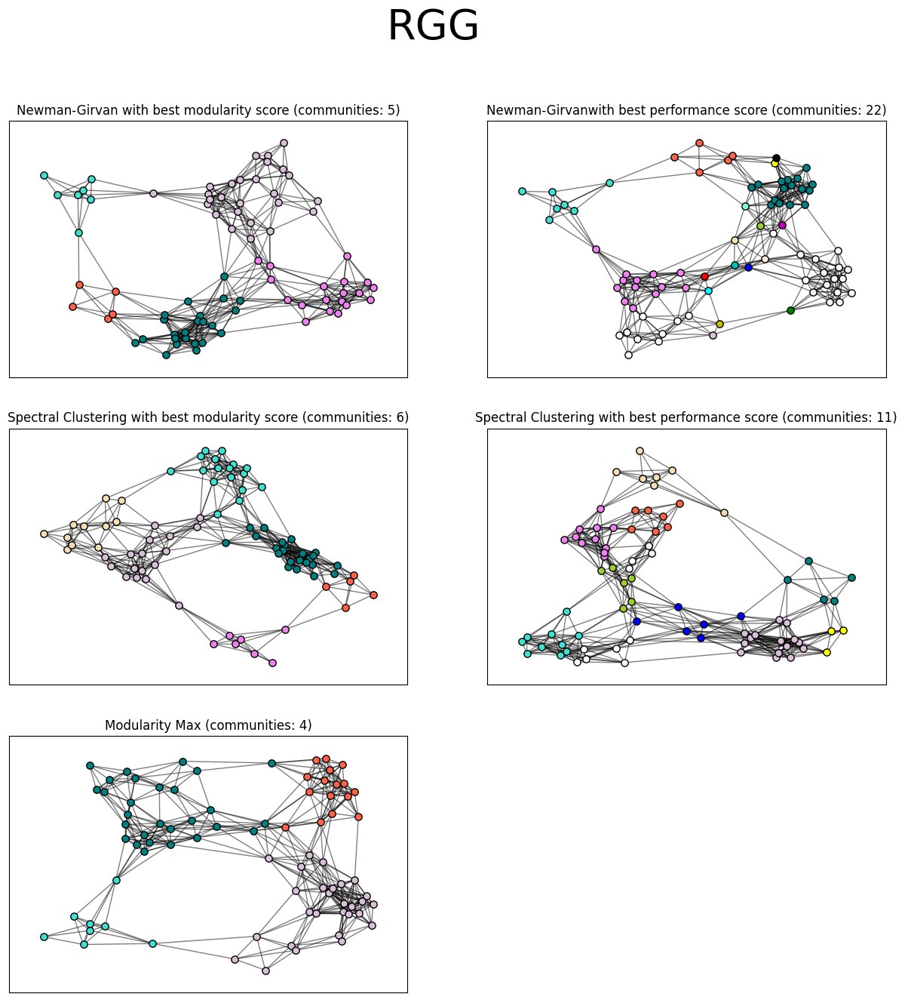

In [137]:
showPlots(RGG, "RGG")

#### Σχολιασμός Αποτελεσμάτων
Για την συγκεκριμένη τοπολογία, αναμένουμε τη δημιουργία κοινοτήτων, καθώς οι κόμβοι συνδέονται κυρίως με τους κοντινούς τους κόμβους. Αυτό επιβεβαιώνεται από τις οπτικοποιήσεις, όπου παρατηρούμε ότι οι περισσότεροι συνδυασμοί αλγορίθμων και μετρικών (με εξαίρεση τον Girvan-Newman με τη μετρική performance) εντοπίζουν κοινότητες που φαίνονται σωστές. Επιπλέον, αξίζει να σημειωθεί ότι οι αλγόριθμοι που αποδίδουν ικανοποιητικά και εντοπίζουν τις αναμενόμενες κοινότητες, παρουσιάζουν κάποια ομοιότητα στα αποτελέσματα τους, καθώς αναγνωρίζουν παρόμοιες ομάδες. Με βάση τις οπτικοποιήσεις, οι Modularity Max και Girvan-Newman με τη modularity δείχνουν να αποδίδουν τα καλύτερα αποτελέσματα.

#### Οπτικοποίηση κοινοτήτων SW

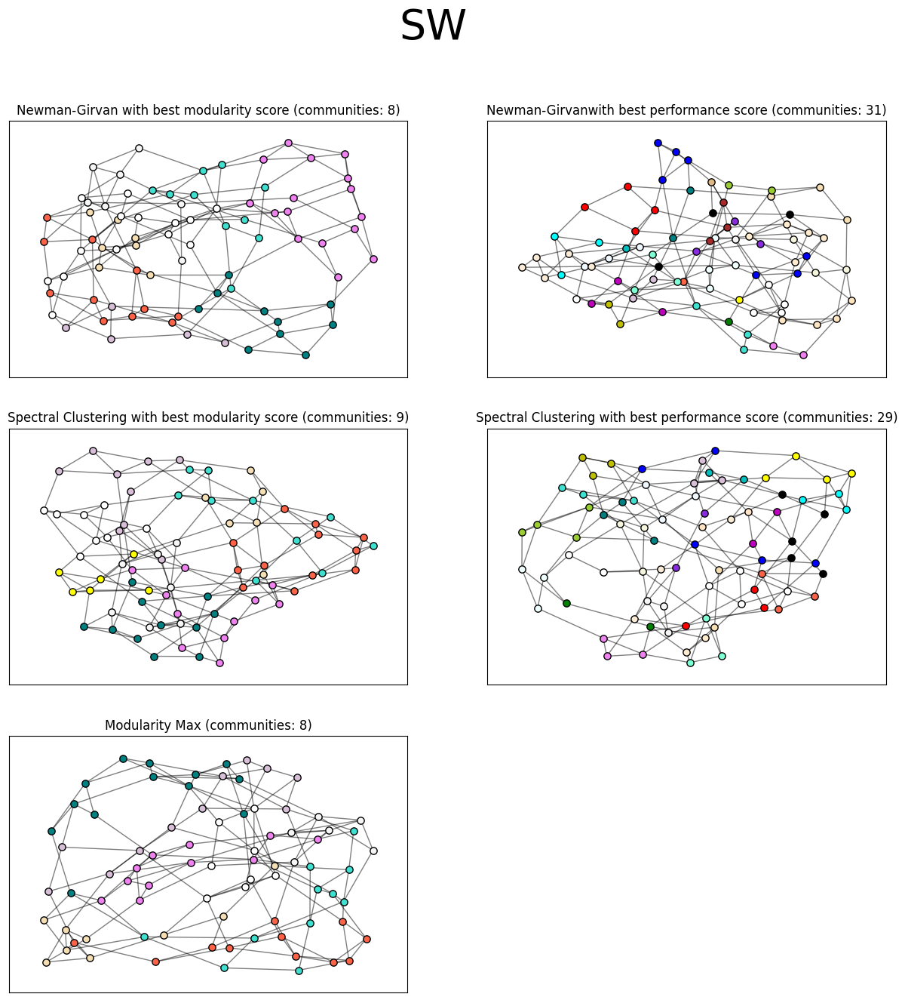

In [138]:
showPlots(SW, "SW")

##### Σχολιασμός Αποτελεσμάτων

Στην τοπολογία Small World αναμένουμε να σχηματιστούν κοινότητες γύρω απο κόμβους με μεγάλο degree. Οπτικά αυτό φαίνεται στους αλγορίθμους οι οποίοι βρήκαν τις κοινότητες με βάση το modularity score.

#### Οπτικοποίηση κοινοτήτων SF

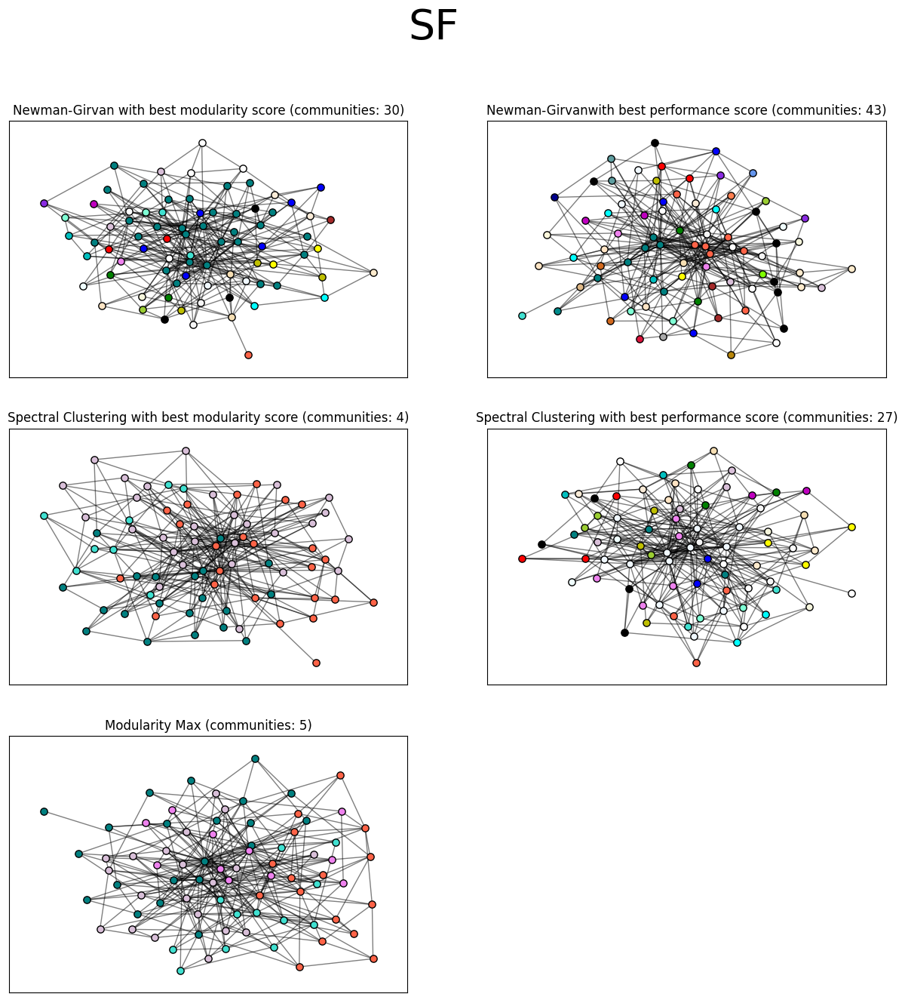

In [139]:
showPlots(SF, "SF")

#### Σχολιασμός Αποτελεσμάτων
Στην περίπτωση της τοπολογίας Scale-Free, είναι αναμενόμενο να δημιουργούνται κοινότητες γύρω από κόμβους με μεγάλο degree, παρόμοια με την τοπολογία Small-World. Από τις οπτικοποιήσεις, παρατηρούμε ότι οι αλγόριθμοι που χρησιμοποίησαν τη μετρική performance, καθώς και ο Girvan-Newman με τη modularity, δεν φαίνεται να απέδωσαν τόσο καλά σε σύγκριση με τους υπόλοιπους. Αντίθετα, οι αλγόριθμοι Modularity Max και Spectral Clustering με τη modularity φαίνεται να έχουν εντοπίσει πιο ικανοποιητικές κοινότητες.